In [1]:
!pip uninstall -y qiskit qiskit-terra qiskit-aer qiskit-ibm-runtime torch torchvision torchaudio

!pip install 'qiskit==2.1.1' --no-cache-dir
!pip install 'qiskit-aer==0.17.1' --no-cache-dir
!pip install 'qiskit-ibm-runtime==0.40.1' --no-cache-dir
!pip install 'qiskit-addon-utils==0.1.1' --no-cache-dir

!pip install 'torch==2.4.1' --index-url https://download.pytorch.org/whl/cpu --no-cache-dir
!pip install 'gymnasium==0.29.1' 'numpy==1.26.4' 'scipy==1.13.1' 'matplotlib==3.9.2' --no-cache-dir
!pip install pylatexenc pandas tabulate

!pip install --upgrade mitiq --no-cache-dir

print("Installation complete.")

Found existing installation: torch 2.9.0+cpu
Uninstalling torch-2.9.0+cpu:
  Successfully uninstalled torch-2.9.0+cpu
Found existing installation: torchvision 0.24.0+cpu
Uninstalling torchvision-0.24.0+cpu:
  Successfully uninstalled torchvision-0.24.0+cpu
Found existing installation: torchaudio 2.9.0+cpu
Uninstalling torchaudio-2.9.0+cpu:
  Successfully uninstalled torchaudio-2.9.0+cpu
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 69.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 207.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 208.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 125.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 378.6/378.6 kB 299.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 257.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pylatexenc: filename=pylatexenc-2.10-py3-none-any.whl size=136817 sha256=493902416aa08fd9a887043bdc70f60df8139ecd03a6b8b70bd8dd095124a6e7
  Stored in directory: /root/.cache/pip/wheels/06/3e/78/fa1588c1ae991bbfd814af2bcac6cef7a178beee1939180d46
Successfully built pylatexenc
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 336.8/336.8 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 63.7 MB/s eta 0:00:00
Installation complete.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from collections import deque, defaultdict
import random
import time
import warnings
import pandas as pd
from tabulate import tabulate
warnings.filterwarnings('ignore')

from qiskit import QuantumCircuit, transpile
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit.library import EfficientSU2
from qiskit.exceptions import QiskitError

from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, depolarizing_error
from qiskit_ibm_runtime.debug_tools import Neat

import mitiq
from mitiq.zne.scaling import fold_gates_at_random
from mitiq.zne.inference import RichardsonFactory

import torch
import torch.nn as nn
import torch.nn.functional as F
import gymnasium as gym
from gymnasium import spaces

print("All imports successful.")

All imports successful.


In [2]:
NOISE_LEVEL = 0.02
SHOTS = 4096

nm = NoiseModel()
err1 = depolarizing_error(NOISE_LEVEL, 1)
err2 = depolarizing_error(NOISE_LEVEL * 2, 2)

nm.add_all_qubit_quantum_error(err1, ['sx', 'x', 'rz', 'id'])
nm.add_all_qubit_quantum_error(err2, ['cx'])

backend_noisy = AerSimulator(noise_model=nm)
backend_ideal = AerSimulator()

def executor_ideal(circuit, observable):
    from qiskit_aer.primitives import Estimator
    est = Estimator()
    job = est.run(circuits=[circuit], observables=[observable], shots=SHOTS)
    return job.result().values[0]

def executor_noisy(circuit, observable):
    from qiskit_aer.primitives import Estimator
    est = Estimator(backend_options={"noise_model": nm})
    job = est.run(circuits=[circuit], observables=[observable], shots=SHOTS)
    return job.result().values[0]

def linear_extrapolate(scale_factors, exp_vals):
    if len(scale_factors) < 2: return exp_vals[0]
    z = np.polyfit(scale_factors, exp_vals, 1)
    return z[1]

def polynomial_extrapolate(scale_factors, exp_vals, degree=2):
    if len(scale_factors) < degree + 1: return exp_vals[0]
    z = np.polyfit(scale_factors, exp_vals, degree)
    return z[degree]

def exponential_extrapolate(scale_factors, exp_vals):
    try:
        valid = [(x, y) for x, y in zip(scale_factors, exp_vals) if y > 1e-5]
        if len(valid) < 2: return exp_vals[0]
        x, y = zip(*valid)
        coeffs = np.polyfit(x, np.log(y), 1)
        return np.exp(coeffs[1])
    except:
        return exp_vals[0]

def richardson_extrapolate(scale_factors, exp_vals):
    try:
        return RichardsonFactory(scale_factors).extrapolate(scale_factors, exp_vals)
    except:
        return exp_vals[0]

print("Backends and executors ready.")

Backends and executors ready.


In [3]:
class ZNEEnvironment(gym.Env):
    def __init__(self, backend):
        super().__init__()
        self.neat = Neat(backend)
        self.target_basis = ['cx', 'sx', 'rz', 'x', 'id']
        self.noisefactor_options = [
            [1.0],
            [1.0, 1.5, 2.0],
            [1.0, 2.0, 3.0],
            [1.0, 1.5, 2.0, 2.5],
            [1.0, 3.0, 5.0],
            [1.0, 2.0, 3.0, 4.0],
            [1.0, 1.5, 3.0],
            [1.0, 2.5, 4.0],
            [1.0, 1.8, 2.6],
            [1.0, 1.25, 1.5],
            [1.0, 4.0, 7.0],
            [1.0, 2.0, 4.0],
            [1.0, 3.5, 6.0],
            [1.0, 1.2, 1.4, 1.6],
            [1.0, 3.0, 4.0, 5.0],
            [1.0, 1.5, 2.0, 2.5, 3.0],
            [1.0, 1.4, 1.8],
            [1.0, 2.2, 3.4],
            [1.0, 1.3, 1.6],
            [1.0, 2.8, 4.6]
        ]
        self.extrapolators = ['linear', 'polynomial', 'exponential', 'richardson']

        n_actions = len(self.noisefactor_options) * len(self.extrapolators)
        self.action_space = spaces.Discrete(n_actions)
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(6,), dtype=np.float32)

        self.num_qubits = 4
        self.trotter_steps = 2

    def reset(self, seed=None, options=None):
        if seed is not None:
            np.random.seed(seed)
            rng = np.random.default_rng(seed)
        else:
            rng = np.random.default_rng()

        nq = self.num_qubits
        ansatz = EfficientSU2(num_qubits=nq, reps=self.trotter_steps, entanglement='linear', su2_gates=['ry', 'rz'])

        num_params = ansatz.num_parameters
        random_params = rng.uniform(0, 2*np.pi, num_params)
        raw_circuit = ansatz.assign_parameters(random_params)
        self.base_u = transpile(raw_circuit, basis_gates=self.target_basis, optimization_level=1)

        raw_obs = SparsePauliOp(['I'*i + 'Z' + 'I'*(nq-1-i) for i in range(nq)], coeffs=[1.0/nq]*nq)
        pubs = [(self.base_u, [raw_obs])]
        clifford_pubs = self.neat.to_clifford(pubs)
        self.circuit = clifford_pubs[0].circuit
        neat_obs = clifford_pubs[0].observables[0]

        if isinstance(neat_obs, dict):
            pauli_list = [(k, complex(v)) for k, v in neat_obs.items()]
            self.observable = SparsePauliOp.from_list(pauli_list)
        else:
            self.observable = SparsePauliOp.from_list(neat_obs.to_list())

        ops = self.circuit.count_ops()
        self.features = {
            'qubits': nq,
            'cx_gates': ops.get('cx', 0) + ops.get('cz', 0),
            'single_gates': sum(ops.get(g, 0) for g in ['sx', 'x', 'rz', 'id', 'ry']),
            'depth': self.circuit.depth(),
            'total_gates': sum(ops.values()),
            'num_params': num_params
        }

        self.ideal = executor_ideal(self.circuit, self.observable)
        unmitigated_val = executor_noisy(self.circuit, self.observable)
        self.unmitigated_error = abs(unmitigated_val - self.ideal)

        return np.array(list(self.features.values()), dtype=np.float32), {}

    def step(self, action):
        template_idx = action // len(self.extrapolators)
        extrap_idx = action % len(self.extrapolators)
        scales = self.noisefactor_options[template_idx]
        extrap_name = self.extrapolators[extrap_idx]


        if len(scales) == 1 and scales[0] == 1.0:
            mitigated = executor_noisy(self.circuit, self.observable)
        else:
            folded = [fold_gates_at_random(self.circuit, s) for s in scales]
            vals = [executor_noisy(fc, self.observable) for fc in folded]

            if extrap_name == 'linear': mitigated = linear_extrapolate(scales, vals)
            elif extrap_name == 'polynomial': mitigated = polynomial_extrapolate(scales, vals)
            elif extrap_name == 'exponential': mitigated = exponential_extrapolate(scales, vals)
            else: mitigated = richardson_extrapolate(scales, vals)

        mitigated_error = abs(mitigated - self.ideal)


        improvement = self.unmitigated_error - mitigated_error
        if improvement > 0:
            reward = improvement * 100
        else:
            reward = max(improvement * 100, -10.0)


        if self.unmitigated_error < 0.002 and mitigated_error < 0.002:
            reward += 1.0

        state = np.array(list(self.features.values()), dtype=np.float32)
        return state, reward, True, False, {'error': mitigated_error, 'unmitigated_error': self.unmitigated_error}

env = ZNEEnvironment(backend_noisy)
print(f"Env initialized. Actions: {env.action_space.n}")

Env initialized. Actions: 80


In [4]:
class DuelingDQN(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=256):
        super().__init__()
        self.feature = nn.Sequential(
            nn.Linear(state_dim, hidden_dim), nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim), nn.ReLU()
        )
        self.value = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2), nn.ReLU(),
            nn.Linear(hidden_dim // 2, 1)
        )
        self.advantage = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2), nn.ReLU(),
            nn.Linear(hidden_dim // 2, action_dim)
        )

    def forward(self, x):
        feat = self.feature(x)
        val = self.value(feat)
        adv = self.advantage(feat)
        return val + (adv - adv.mean(dim=1, keepdim=True))

class PrioritizedReplayBuffer:
    def __init__(self, capacity, alpha=0.6, beta=0.4, beta_inc=0.001):
        self.capacity = capacity
        self.alpha = alpha
        self.beta = beta
        self.beta_inc = beta_inc
        self.buffer = []
        self.priorities = np.zeros(capacity, dtype=np.float32)
        self.pos = 0

    def push(self, transition, td_error):
        prio = (abs(td_error) + 1e-5) ** self.alpha
        if len(self.buffer) < self.capacity: self.buffer.append(transition)
        else: self.buffer[self.pos] = transition
        self.priorities[self.pos] = prio
        self.pos = (self.pos + 1) % self.capacity

    def sample(self, batch_size):
        N = len(self.buffer)
        prios = self.priorities[:N]
        probs = prios / prios.sum()
        indices = np.random.choice(N, batch_size, p=probs)
        weights = (N * probs[indices]) ** (-self.beta)
        weights /= weights.max()
        self.beta = min(1.0, self.beta + self.beta_inc)
        return [self.buffer[i] for i in indices], indices, torch.FloatTensor(weights)

    def update_priorities(self, indices, td_errors):
        for i, e in zip(indices, td_errors): self.priorities[i] = (abs(e) + 1e-5) ** self.alpha

    def __len__(self): return len(self.buffer)

class DoubleDQNAgent:

    def __init__(self, state_dim, action_dim, lr=5e-5, gamma=0.99, tau=0.005, buffer_size=50000):
        self.action_dim = action_dim
        self.gamma = gamma
        self.tau = tau
        self.q_network = DuelingDQN(state_dim, action_dim)
        self.target_network = DuelingDQN(state_dim, action_dim)
        self.target_network.load_state_dict(self.q_network.state_dict())
        self.optimizer = torch.optim.Adam(self.q_network.parameters(), lr=lr)
        self.memory = PrioritizedReplayBuffer(buffer_size)
        self.epsilon = 1.0
        self.epsilon_min = 0.05
        self.epsilon_decay = 0.99995

    def select_action(self, state, training=True):
        if training and random.random() < self.epsilon: return random.randrange(self.action_dim)
        with torch.no_grad(): return self.q_network(torch.FloatTensor(state).unsqueeze(0)).argmax().item()

    def store_transition(self, state, action, reward, next_state, done):
        with torch.no_grad():
            q = self.q_network(torch.FloatTensor(state).unsqueeze(0))[0, action]
            nq = self.target_network(torch.FloatTensor(next_state).unsqueeze(0)).max().item()
            err = reward + self.gamma * nq * (1 - done) - q.item()
        self.memory.push((state, action, reward, next_state, done), err)

    def update(self, batch_size=64):
        if len(self.memory) < batch_size: return 0.0
        batch, idxs, w = self.memory.sample(batch_size)
        states = torch.FloatTensor([t[0] for t in batch])
        actions = torch.LongTensor([t[1] for t in batch])
        rewards = torch.FloatTensor([t[2] for t in batch])
        next_states = torch.FloatTensor([t[3] for t in batch])
        dones = torch.FloatTensor([t[4] for t in batch])

        curr_q = self.q_network(states).gather(1, actions.unsqueeze(1))
        with torch.no_grad():
            next_a = self.q_network(next_states).argmax(1)
            next_q = self.target_network(next_states).gather(1, next_a.unsqueeze(1)).squeeze()
            tgt_q = rewards + self.gamma * next_q * (1 - dones)

        errs = (tgt_q - curr_q.squeeze()).detach().numpy()
        self.memory.update_priorities(idxs, errs)
        loss = (w * F.mse_loss(curr_q.squeeze(), tgt_q, reduction='none')).mean()

        self.optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(self.q_network.parameters(), 10.0)
        self.optimizer.step()

        for t_p, p in zip(self.target_network.parameters(), self.q_network.parameters()):
            t_p.data.copy_(self.tau * p.data + (1 - self.tau) * t_p.data)
        self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
        return loss.item()

agent = DoubleDQNAgent(state_dim=6, action_dim=env.action_space.n)
print("Agent Ready.")

Agent Ready.


Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.104726

Episode: 287 | Stage: 1 | Reps: 2
Action: [1.0] + richardson
Raw Err: 0.017944 | Mit Err: 0.024536 | Rwd: -0.659180
Avg Raw (100): 0.028816
Avg Mit (100): 0.104030

Episode: 288 | Stage: 1 | Reps: 2
Action: [1.0, 4.0, 7.0] + richardson
Raw Err: 0.009155 | Mit Err: 0.014106 | Rwd: -0.495063
Avg Raw (100): 0.028724
Avg Mit (100): 0.103838

Episode: 289 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 5.0] + polynomial
Raw Err: 0.006592 | Mit Err: 0.033386 | Rwd: -2.679443
Avg Raw (100): 0.028087
Avg Mit (100): 0.103234

Episode: 290 | Stage: 1 | Reps: 2
Action: [1.0, 2.0, 4.0] + richardson
Raw Err: 0.019531 | Mit Err: 0.017253 | Rwd: 0.227865
Avg Raw (100): 0.028218
Avg Mit (100): 0.103329

Episode: 291 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 5.0] + richardson
Raw Err: 0.138184 | Mit Err: 0.155151 | Rwd: -1.696777
Avg Raw (100): 0.029230
Avg Mit (100): 0.104513

Episode: 292 | Stage: 1 | Reps: 2
Action: [1.0, 4.0, 7.0] + 

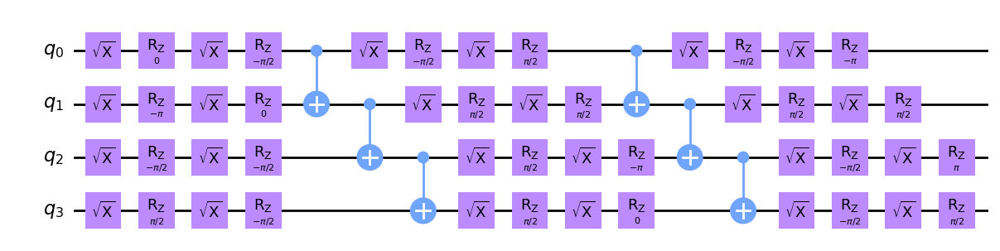

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.053774

Episode: 1287 | Stage: 1 | Reps: 2
Action: [1.0, 1.2, 1.4, 1.6] + linear
Raw Err: 0.001099 | Mit Err: 0.039038 | Rwd: -3.793945
Avg Raw (100): 0.029349
Avg Mit (100): 0.054064

Episode: 1288 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 4.0, 5.0] + exponential
Raw Err: 0.000366 | Mit Err: 0.015627 | Rwd: -1.526091
Avg Raw (100): 0.029004
Avg Mit (100): 0.053747

Episode: 1289 | Stage: 1 | Reps: 2
Action: [1.0, 1.8, 2.6] + richardson
Raw Err: 0.086792 | Mit Err: 0.099461 | Rwd: -1.266861
Avg Raw (100): 0.029827
Avg Mit (100): 0.054631

Episode: 1290 | Stage: 1 | Reps: 2
Action: [1.0, 1.4, 1.8] + richardson
Raw Err: 0.002319 | Mit Err: 0.050781 | Rwd: -4.846191
Avg Raw (100): 0.029647
Avg Mit (100): 0.055078

Episode: 1291 | Stage: 1 | Reps: 2
Action: [1.0, 1.5, 3.0] + linear
Raw Err: 0.004272 | Mit Err: 0.023729 | Rwd: -1.945613
Avg Raw (100): 0.029348
Avg Mit (100): 0.054900

Episode: 1292 | Stage: 1 | Reps: 2
Action

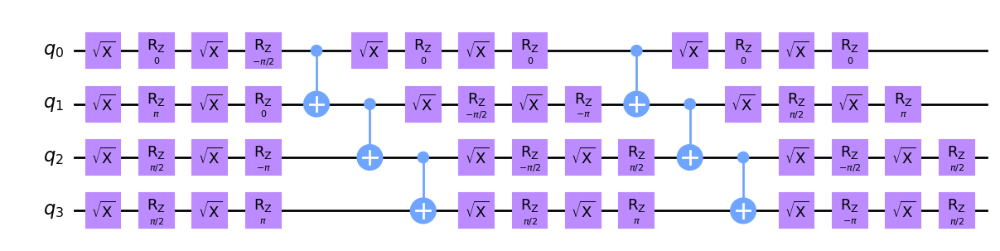

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.062732

Episode: 2287 | Stage: 1 | Reps: 2
Action: [1.0, 1.8, 2.6] + exponential
Raw Err: 0.077393 | Mit Err: 0.098424 | Rwd: -2.103111
Avg Raw (100): 0.031200
Avg Mit (100): 0.063494

Episode: 2288 | Stage: 1 | Reps: 2
Action: [1.0, 1.5, 2.0, 2.5] + polynomial
Raw Err: 0.007324 | Mit Err: 0.054224 | Rwd: -4.689941
Avg Raw (100): 0.031232
Avg Mit (100): 0.064016

Episode: 2289 | Stage: 1 | Reps: 2
Action: [1.0, 2.0, 4.0] + exponential
Raw Err: 0.003906 | Mit Err: 0.014571 | Rwd: -1.066440
Avg Raw (100): 0.030698
Avg Mit (100): 0.063324

Episode: 2290 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 5.0] + linear
Raw Err: 0.046753 | Mit Err: 0.043569 | Rwd: 0.318400
Avg Raw (100): 0.029686
Avg Mit (100): 0.061841

Episode: 2291 | Stage: 1 | Reps: 2
Action: [1.0, 1.3, 1.6] + linear
Raw Err: 0.085449 | Mit Err: 0.053385 | Rwd: 3.206380
Avg Raw (100): 0.030420
Avg Mit (100): 0.059196

Episode: 2292 | Stage: 1 | Reps: 2
Action: [1.0

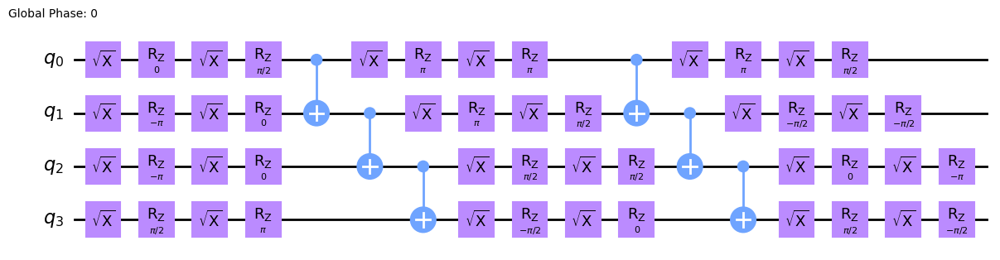

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 5.785209

Episode: 3287 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 4.0, 5.0] + polynomial
Raw Err: 0.007446 | Mit Err: 0.003857 | Rwd: 0.358887
Avg Raw (100): 0.031886
Avg Mit (100): 5.785151

Episode: 3288 | Stage: 1 | Reps: 2
Action: [1.0, 1.5, 3.0] + richardson
Raw Err: 0.074341 | Mit Err: 0.108215 | Rwd: -3.387451
Avg Raw (100): 0.032219
Avg Mit (100): 5.785712

Episode: 3289 | Stage: 1 | Reps: 2
Action: [1.0, 2.8, 4.6] + polynomial
Raw Err: 0.058105 | Mit Err: 0.044101 | Rwd: 1.400493
Avg Raw (100): 0.032793
Avg Mit (100): 5.786125

Episode: 3290 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 4.0, 5.0] + linear
Raw Err: 0.011597 | Mit Err: 0.005458 | Rwd: 0.613839
Avg Raw (100): 0.032797
Avg Mit (100): 5.786108

Episode: 3291 | Stage: 1 | Reps: 2
Action: [1.0, 3.0, 4.0, 5.0] + polynomial
Raw Err: 0.212524 | Mit Err: 0.176685 | Rwd: 3.583984
Avg Raw (100): 0.034901
Avg Mit (100): 5.787822

Episode: 3292 | Stage: 1 | Reps: 2
Ac

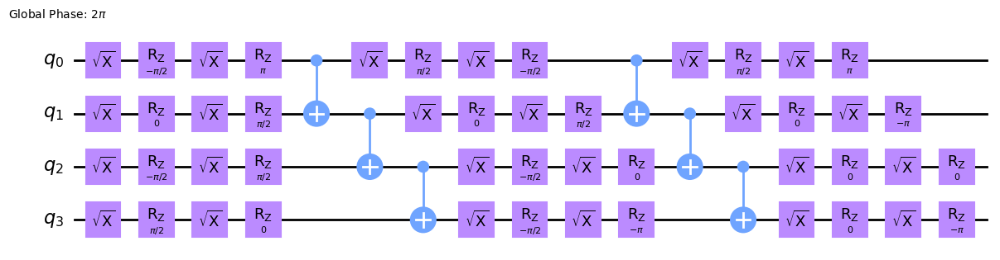

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 24.164358

Episode: 4287 | Stage: 1 | Reps: 2
Action: [1.0] + richardson
Raw Err: 0.010498 | Mit Err: 0.005737 | Rwd: 0.476074
Avg Raw (100): 0.022686
Avg Mit (100): 24.163996

Episode: 4288 | Stage: 1 | Reps: 2
Action: [1.0, 1.3, 1.6] + linear
Raw Err: 0.006592 | Mit Err: 0.002747 | Rwd: 0.384521
Avg Raw (100): 0.022562
Avg Mit (100): 24.163864

Episode: 4289 | Stage: 1 | Reps: 2
Action: [1.0, 1.4, 1.8] + richardson
Raw Err: 0.012817 | Mit Err: 0.145706 | Rwd: -10.000000
Avg Raw (100): 0.020839
Avg Mit (100): 24.163432

Episode: 4290 | Stage: 1 | Reps: 2
Action: [1.0, 2.2, 3.4] + exponential
Raw Err: 0.008545 | Mit Err: 0.006348 | Rwd: 0.219727
Avg Raw (100): 0.020924
Avg Mit (100): 24.163491

Episode: 4291 | Stage: 1 | Reps: 2
Action: [1.0, 2.0, 3.0] + richardson
Raw Err: 0.007935 | Mit Err: 0.021973 | Rwd: -1.403809
Avg Raw (100): 0.020948
Avg Mit (100): 24.163645

Episode: 4292 | Stage: 1 | Reps: 2
Action: [1.0] + ri

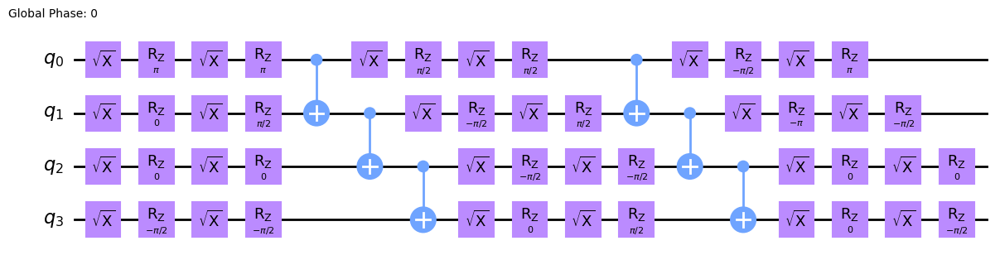

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.067696

Episode: 5287 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 2.0] + exponential
Raw Err: 0.009033 | Mit Err: 0.014926 | Rwd: -0.589232
Avg Raw (100): 0.030363
Avg Mit (100): 0.067745

Episode: 5288 | Stage: 2 | Reps: 3
Action: [1.0, 3.0, 5.0] + polynomial
Raw Err: 0.007812 | Mit Err: 0.015274 | Rwd: -0.746155
Avg Raw (100): 0.030354
Avg Mit (100): 0.067783

Episode: 5289 | Stage: 2 | Reps: 3
Action: [1.0, 3.5, 6.0] + linear
Raw Err: 0.004639 | Mit Err: 0.002043 | Rwd: 0.259603
Avg Raw (100): 0.030280
Avg Mit (100): 0.067739

Episode: 5290 | Stage: 2 | Reps: 3
Action: [1.0, 3.5, 6.0] + linear
Raw Err: 0.097412 | Mit Err: 0.083525 | Rwd: 1.388753
Avg Raw (100): 0.031251
Avg Mit (100): 0.068514

Episode: 5291 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 2.0, 2.5] + richardson
Raw Err: 0.005737 | Mit Err: 0.216431 | Rwd: -10.000000
Avg Raw (100): 0.030890
Avg Mit (100): 0.070186

Episode: 5292 | Stage: 2 | Reps: 3
Action: [1.0

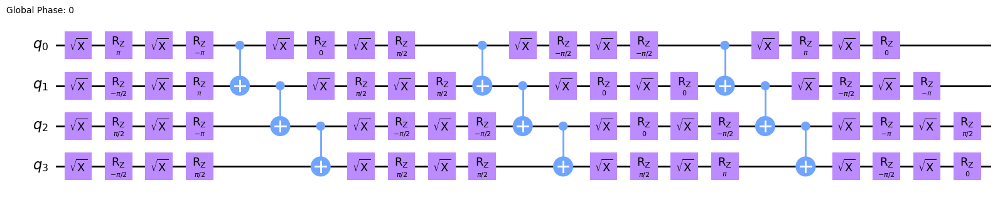

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.055393

Episode: 6287 | Stage: 2 | Reps: 3
Action: [1.0] + linear
Raw Err: 0.019897 | Mit Err: 0.030640 | Rwd: -1.074219
Avg Raw (100): 0.025450
Avg Mit (100): 0.055658

Episode: 6288 | Stage: 2 | Reps: 3
Action: [1.0, 1.2, 1.4, 1.6] + richardson
Raw Err: 0.005981 | Mit Err: 0.080566 | Rwd: -7.458496
Avg Raw (100): 0.025427
Avg Mit (100): 0.056318

Episode: 6289 | Stage: 2 | Reps: 3
Action: [1.0, 4.0, 7.0] + exponential
Raw Err: 0.097534 | Mit Err: 0.109863 | Rwd: -1.232910
Avg Raw (100): 0.025958
Avg Mit (100): 0.057026

Episode: 6290 | Stage: 2 | Reps: 3
Action: [1.0, 2.2, 3.4] + linear
Raw Err: 0.012207 | Mit Err: 0.017965 | Rwd: -0.575765
Avg Raw (100): 0.025962
Avg Mit (100): 0.057014

Episode: 6291 | Stage: 2 | Reps: 3
Action: [1.0, 1.3, 1.6] + polynomial
Raw Err: 0.015991 | Mit Err: 0.219021 | Rwd: -10.000000
Avg Raw (100): 0.025767
Avg Mit (100): 0.058752

Episode: 6292 | Stage: 2 | Reps: 3
Action: [1.0, 3.0, 5

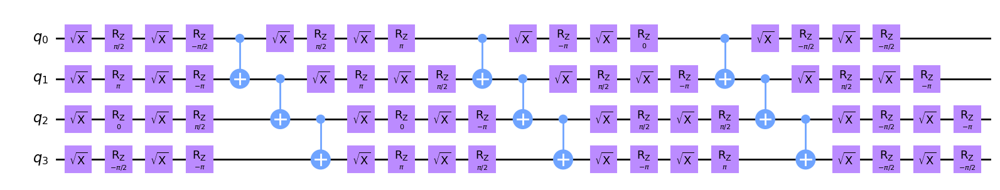

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.243238

Episode: 7287 | Stage: 2 | Reps: 3
Action: [1.0, 4.0, 7.0] + richardson
Raw Err: 0.005981 | Mit Err: 0.000570 | Rwd: 0.541178
Avg Raw (100): 0.030920
Avg Mit (100): 0.243205

Episode: 7288 | Stage: 2 | Reps: 3
Action: [1.0, 4.0, 7.0] + richardson
Raw Err: 0.057861 | Mit Err: 0.048530 | Rwd: 0.933160
Avg Raw (100): 0.031331
Avg Mit (100): 0.243626

Episode: 7289 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 3.0] + exponential
Raw Err: 0.008667 | Mit Err: 0.006470 | Rwd: 0.219727
Avg Raw (100): 0.031322
Avg Mit (100): 0.243605

Episode: 7290 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 2.0, 2.5] + linear
Raw Err: 0.002319 | Mit Err: 0.028503 | Rwd: -2.618408
Avg Raw (100): 0.030806
Avg Mit (100): 0.243557

Episode: 7291 | Stage: 2 | Reps: 3
Action: [1.0, 1.4, 1.8] + exponential
Raw Err: 0.047974 | Mit Err: 0.035522 | Rwd: 1.245117
Avg Raw (100): 0.031180
Avg Mit (100): 0.243832

Episode: 7292 | Stage: 2 | Reps: 3
Action: [1

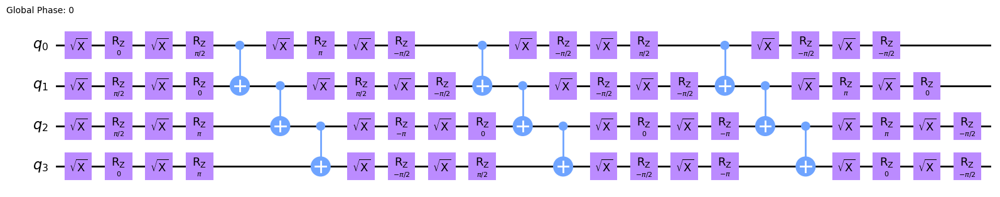

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.060812

Episode: 8287 | Stage: 2 | Reps: 3
Action: [1.0, 2.0, 3.0, 4.0] + linear
Raw Err: 0.050415 | Mit Err: 0.043396 | Rwd: 0.701904
Avg Raw (100): 0.029178
Avg Mit (100): 0.060184

Episode: 8288 | Stage: 2 | Reps: 3
Action: [1.0, 2.0, 3.0, 4.0] + linear
Raw Err: 0.013062 | Mit Err: 0.019653 | Rwd: -0.659180
Avg Raw (100): 0.028977
Avg Mit (100): 0.059945

Episode: 8289 | Stage: 2 | Reps: 3
Action: [1.0, 2.0, 3.0, 4.0] + richardson
Raw Err: 0.003418 | Mit Err: 0.003174 | Rwd: 0.024414
Avg Raw (100): 0.029003
Avg Mit (100): 0.059700

Episode: 8290 | Stage: 2 | Reps: 3
Action: [1.0, 1.25, 1.5] + exponential
Raw Err: 0.001099 | Mit Err: 0.005414 | Rwd: -0.431518
Avg Raw (100): 0.027552
Avg Mit (100): 0.058308

Episode: 8291 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 2.0] + richardson
Raw Err: 0.004639 | Mit Err: 0.025879 | Rwd: -2.124023
Avg Raw (100): 0.027585
Avg Mit (100): 0.058181

Episode: 8292 | Stage: 2 | Reps: 3
Ac

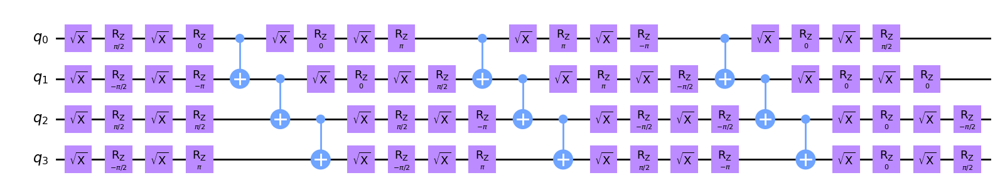

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.069273

Episode: 9287 | Stage: 2 | Reps: 3
Action: [1.0, 1.2, 1.4, 1.6] + linear
Raw Err: 0.002686 | Mit Err: 0.004236 | Rwd: -0.155029
Avg Raw (100): 0.030397
Avg Mit (100): 0.069314

Episode: 9288 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 2.0, 2.5, 3.0] + linear
Raw Err: 0.025269 | Mit Err: 0.020508 | Rwd: 0.476074
Avg Raw (100): 0.030585
Avg Mit (100): 0.069308

Episode: 9289 | Stage: 2 | Reps: 3
Action: [1.0, 3.5, 6.0] + exponential
Raw Err: 0.122803 | Mit Err: 0.135254 | Rwd: -1.245117
Avg Raw (100): 0.030446
Avg Mit (100): 0.067715

Episode: 9290 | Stage: 2 | Reps: 3
Action: [1.0, 1.5, 2.0, 2.5, 3.0] + linear
Raw Err: 0.070068 | Mit Err: 0.071240 | Rwd: -0.117187
Avg Raw (100): 0.030017
Avg Mit (100): 0.067307

Episode: 9291 | Stage: 2 | Reps: 3
Action: [1.0, 4.0, 7.0] + linear
Raw Err: 0.010132 | Mit Err: 0.003581 | Rwd: 0.655111
Avg Raw (100): 0.029315
Avg Mit (100): 0.065947

Episode: 9292 | Stage: 2 | Reps: 3
A

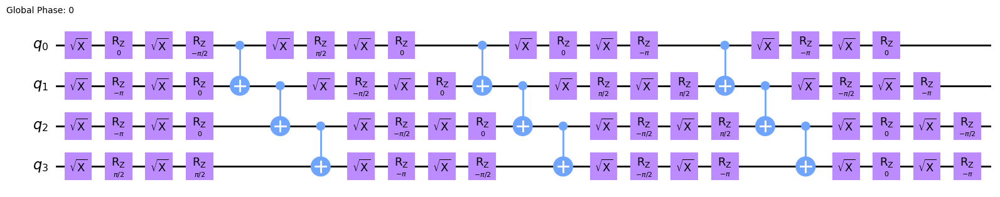

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.043798

Episode: 10287 | Stage: 3 | Reps: 5
Action: [1.0] + polynomial
Raw Err: 0.180664 | Mit Err: 0.173340 | Rwd: 0.732422
Avg Raw (100): 0.038102
Avg Mit (100): 0.044893

Episode: 10288 | Stage: 3 | Reps: 5
Action: [1.0, 3.0, 4.0, 5.0] + polynomial
Raw Err: 0.160278 | Mit Err: 0.133838 | Rwd: 2.644043
Avg Raw (100): 0.039640
Avg Mit (100): 0.046173

Episode: 10289 | Stage: 3 | Reps: 5
Action: [1.0, 1.2, 1.4, 1.6] + richardson
Raw Err: 0.009277 | Mit Err: 0.887085 | Rwd: -10.000000
Avg Raw (100): 0.038007
Avg Mit (100): 0.053402

Episode: 10290 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 4.0] + exponential
Raw Err: 0.009766 | Mit Err: 0.005255 | Rwd: 0.451079
Avg Raw (100): 0.037960
Avg Mit (100): 0.053452

Episode: 10291 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 3.0, 4.0] + polynomial
Raw Err: 0.021362 | Mit Err: 0.036407 | Rwd: -1.504517
Avg Raw (100): 0.038158
Avg Mit (100): 0.053812

Episode: 10292 | Stage: 3 | Reps: 5

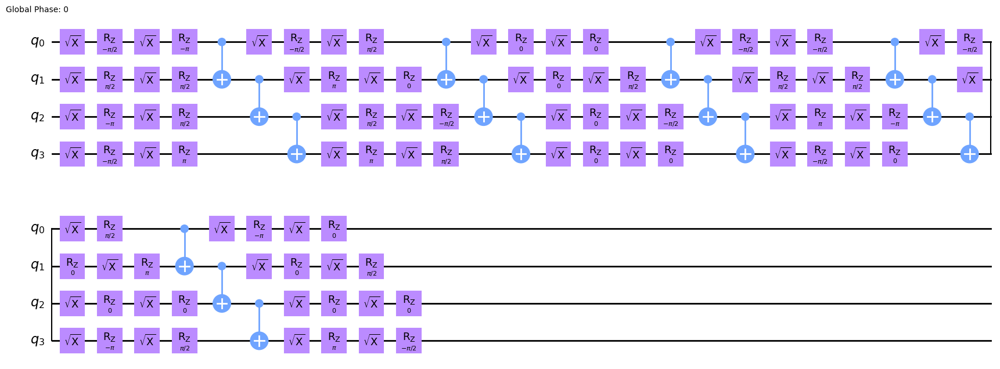

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.069690

Episode: 11287 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 3.0] + polynomial
Raw Err: 0.004272 | Mit Err: 0.046021 | Rwd: -4.174805
Avg Raw (100): 0.039984
Avg Mit (100): 0.070130

Episode: 11288 | Stage: 3 | Reps: 5
Action: [1.0, 3.0, 4.0, 5.0] + polynomial
Raw Err: 0.001465 | Mit Err: 0.016626 | Rwd: -1.516113
Avg Raw (100): 0.038469
Avg Mit (100): 0.068970

Episode: 11289 | Stage: 3 | Reps: 5
Action: [1.0] + richardson
Raw Err: 0.004150 | Mit Err: 0.000244 | Rwd: 0.390625
Avg Raw (100): 0.037119
Avg Mit (100): 0.067532

Episode: 11290 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 4.0] + exponential
Raw Err: 0.058472 | Mit Err: 0.066040 | Rwd: -0.756836
Avg Raw (100): 0.037552
Avg Mit (100): 0.067920

Episode: 11291 | Stage: 3 | Reps: 5
Action: [1.0, 2.5, 4.0] + polynomial
Raw Err: 0.008667 | Mit Err: 0.021444 | Rwd: -1.277669
Avg Raw (100): 0.037593
Avg Mit (100): 0.067970

Episode: 11292 | Stage: 3 | Reps: 5
Action: 

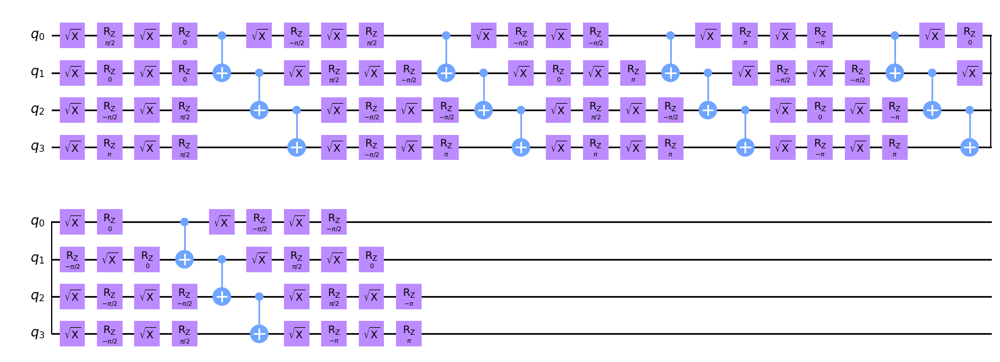

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.049663

Episode: 12287 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 4.0] + linear
Raw Err: 0.188965 | Mit Err: 0.188477 | Rwd: 0.048828
Avg Raw (100): 0.034055
Avg Mit (100): 0.051309

Episode: 12288 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 4.0] + linear
Raw Err: 0.009888 | Mit Err: 0.015747 | Rwd: -0.585938
Avg Raw (100): 0.033958
Avg Mit (100): 0.051445

Episode: 12289 | Stage: 3 | Reps: 5
Action: [1.0] + richardson
Raw Err: 0.156128 | Mit Err: 0.165161 | Rwd: -0.903320
Avg Raw (100): 0.033788
Avg Mit (100): 0.051567

Episode: 12290 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 3.0, 4.0] + polynomial
Raw Err: 0.003296 | Mit Err: 0.015747 | Rwd: -1.245117
Avg Raw (100): 0.032458
Avg Mit (100): 0.050277

Episode: 12291 | Stage: 3 | Reps: 5
Action: [1.0, 3.5, 6.0] + exponential
Raw Err: 0.001587 | Mit Err: 0.004883 | Rwd: -0.329590
Avg Raw (100): 0.032288
Avg Mit (100): 0.050272

Episode: 12292 | Stage: 3 | Reps: 5
Action: [1.0] + 

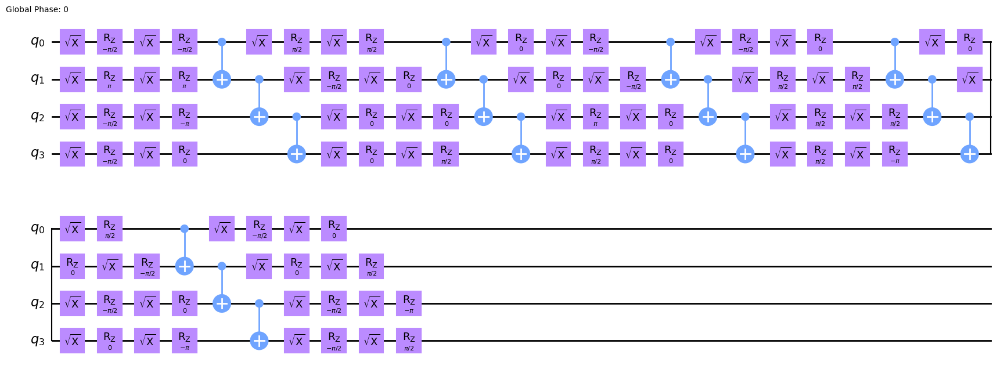

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.106982

Episode: 13287 | Stage: 3 | Reps: 5
Action: [1.0, 3.0, 4.0, 5.0] + linear
Raw Err: 0.004028 | Mit Err: 0.013508 | Rwd: -0.947963
Avg Raw (100): 0.037090
Avg Mit (100): 0.105374

Episode: 13288 | Stage: 3 | Reps: 5
Action: [1.0, 3.5, 6.0] + linear
Raw Err: 0.011597 | Mit Err: 0.005843 | Rwd: 0.575358
Avg Raw (100): 0.037113
Avg Mit (100): 0.105386

Episode: 13289 | Stage: 3 | Reps: 5
Action: [1.0, 2.0, 4.0] + linear
Raw Err: 0.008057 | Mit Err: 0.005310 | Rwd: 0.274658
Avg Raw (100): 0.037181
Avg Mit (100): 0.105436

Episode: 13290 | Stage: 3 | Reps: 5
Action: [1.0, 2.5, 4.0] + linear
Raw Err: 0.004150 | Mit Err: 0.011658 | Rwd: -0.750732
Avg Raw (100): 0.037128
Avg Mit (100): 0.105437

Episode: 13291 | Stage: 3 | Reps: 5
Action: [1.0] + polynomial
Raw Err: 0.013306 | Mit Err: 0.009033 | Rwd: 0.427246
Avg Raw (100): 0.037218
Avg Mit (100): 0.105458

Episode: 13292 | Stage: 3 | Reps: 5
Action: [1.0, 2.5, 4.0] + l

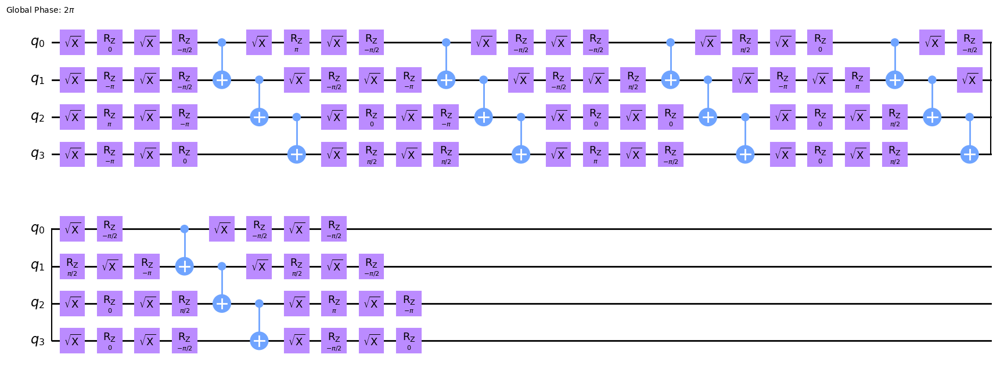

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.058047

Episode: 14287 | Stage: 3 | Reps: 5
Action: [1.0, 2.8, 4.6] + exponential
Raw Err: 0.004028 | Mit Err: 0.024313 | Rwd: -2.028425
Avg Raw (100): 0.044769
Avg Mit (100): 0.056434

Episode: 14288 | Stage: 3 | Reps: 5
Action: [1.0, 1.25, 1.5] + exponential
Raw Err: 0.124512 | Mit Err: 0.127808 | Rwd: -0.329590
Avg Raw (100): 0.045919
Avg Mit (100): 0.057626

Episode: 14289 | Stage: 3 | Reps: 5
Action: [1.0, 1.5, 2.0] + polynomial
Raw Err: 0.344727 | Mit Err: 0.270508 | Rwd: 7.421875
Avg Raw (100): 0.049236
Avg Mit (100): 0.060138

Episode: 14290 | Stage: 3 | Reps: 5
Action: [1.0, 2.8, 4.6] + exponential
Raw Err: 0.011475 | Mit Err: 0.005176 | Rwd: 0.629880
Avg Raw (100): 0.049166
Avg Mit (100): 0.060185

Episode: 14291 | Stage: 3 | Reps: 5
Action: [1.0, 2.5, 4.0] + linear
Raw Err: 0.003052 | Mit Err: 0.024882 | Rwd: -2.183024
Avg Raw (100): 0.049148
Avg Mit (100): 0.060383

Episode: 14292 | Stage: 3 | Reps: 5
Actio

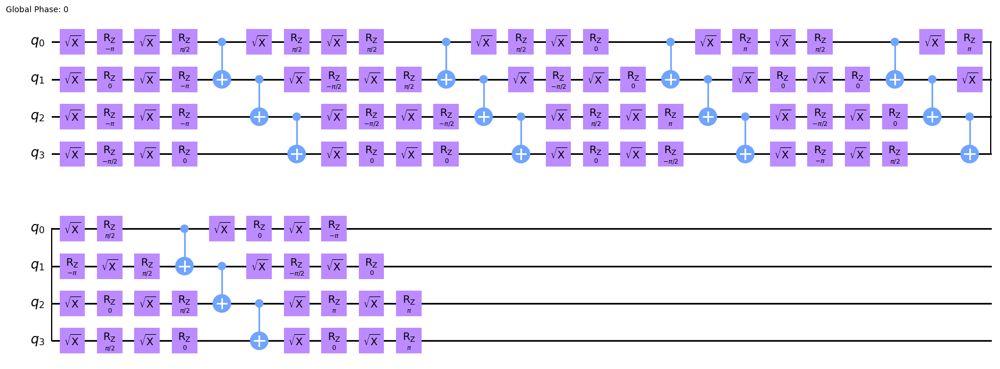

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.055173

Episode: 15287 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + exponential
Raw Err: 0.017944 | Mit Err: 0.003052 | Rwd: 1.489258
Avg Raw (100): 0.037736
Avg Mit (100): 0.055202

Episode: 15288 | Stage: 4 | Reps: 6
Action: [1.0, 4.0, 7.0] + linear
Raw Err: 0.009766 | Mit Err: 0.019979 | Rwd: -1.021322
Avg Raw (100): 0.037772
Avg Mit (100): 0.055270

Episode: 15289 | Stage: 4 | Reps: 6
Action: [1.0, 1.5, 2.0, 2.5, 3.0] + linear
Raw Err: 0.003540 | Mit Err: 0.030933 | Rwd: -2.739258
Avg Raw (100): 0.037717
Avg Mit (100): 0.055447

Episode: 15290 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + exponential
Raw Err: 0.189941 | Mit Err: 0.183903 | Rwd: 0.603807
Avg Raw (100): 0.039564
Avg Mit (100): 0.057179

Episode: 15291 | Stage: 4 | Reps: 6
Action: [1.0, 1.5, 2.0, 2.5] + polynomial
Raw Err: 0.017822 | Mit Err: 0.016443 | Rwd: 0.137939
Avg Raw (100): 0.039667
Avg Mit (100): 0.057293

Episode: 15292 | Stage:

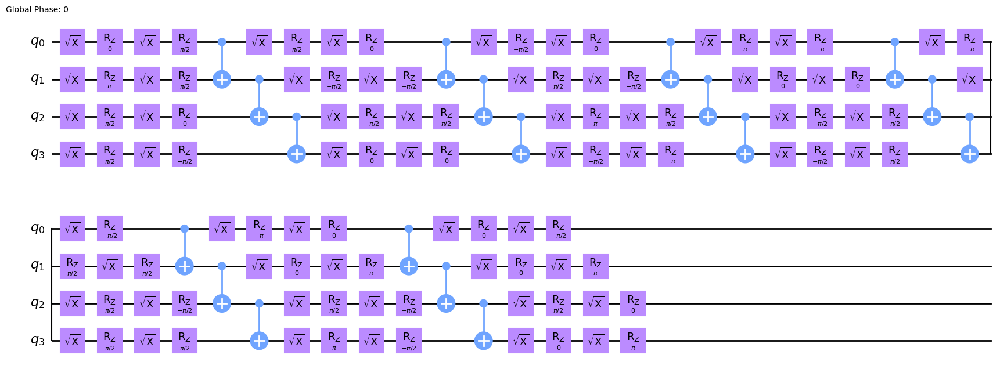

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.060536

Episode: 16287 | Stage: 4 | Reps: 6
Action: [1.0, 1.25, 1.5] + richardson
Raw Err: 0.010498 | Mit Err: 0.669067 | Rwd: -10.000000
Avg Raw (100): 0.041797
Avg Mit (100): 0.055999

Episode: 16288 | Stage: 4 | Reps: 6
Action: [1.0, 2.5, 4.0] + exponential
Raw Err: 0.186890 | Mit Err: 0.184570 | Rwd: 0.231934
Avg Raw (100): 0.040383
Avg Mit (100): 0.054667

Episode: 16289 | Stage: 4 | Reps: 6
Action: [1.0, 1.5, 2.0, 2.5] + linear
Raw Err: 0.003296 | Mit Err: 0.004626 | Rwd: -0.133057
Avg Raw (100): 0.040413
Avg Mit (100): 0.054414

Episode: 16290 | Stage: 4 | Reps: 6
Action: [1.0, 4.0, 7.0] + linear
Raw Err: 0.000488 | Mit Err: 0.007284 | Rwd: -0.679525
Avg Raw (100): 0.040413
Avg Mit (100): 0.054416

Episode: 16291 | Stage: 4 | Reps: 6
Action: [1.0, 1.5, 2.0] + linear
Raw Err: 0.017944 | Mit Err: 0.020793 | Rwd: -0.284831
Avg Raw (100): 0.040560
Avg Mit (100): 0.054580

Episode: 16292 | Stage: 4 | Reps: 6
Action: 

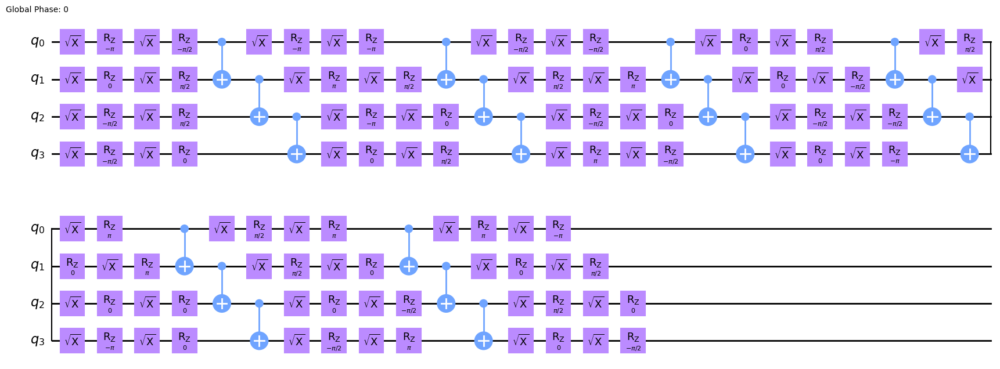

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.048039

Episode: 17287 | Stage: 4 | Reps: 6
Action: [1.0, 1.25, 1.5] + linear
Raw Err: 0.001831 | Mit Err: 0.023641 | Rwd: -2.180990
Avg Raw (100): 0.044376
Avg Mit (100): 0.048200

Episode: 17288 | Stage: 4 | Reps: 6
Action: [1.0] + richardson
Raw Err: 0.180420 | Mit Err: 0.201294 | Rwd: -2.087402
Avg Raw (100): 0.045824
Avg Mit (100): 0.050047

Episode: 17289 | Stage: 4 | Reps: 6
Action: [1.0] + linear
Raw Err: 0.072998 | Mit Err: 0.070801 | Rwd: 0.219727
Avg Raw (100): 0.046404
Avg Mit (100): 0.050679

Episode: 17290 | Stage: 4 | Reps: 6
Action: [1.0] + linear
Raw Err: 0.034302 | Mit Err: 0.040771 | Rwd: -0.646973
Avg Raw (100): 0.044869
Avg Mit (100): 0.049190

Episode: 17291 | Stage: 4 | Reps: 6
Action: [1.0] + linear
Raw Err: 0.003174 | Mit Err: 0.000610 | Rwd: 0.256348
Avg Raw (100): 0.044868
Avg Mit (100): 0.049168

Episode: 17292 | Stage: 4 | Reps: 6
Action: [1.0] + linear
Raw Err: 0.005493 | Mit Err: 0.001221

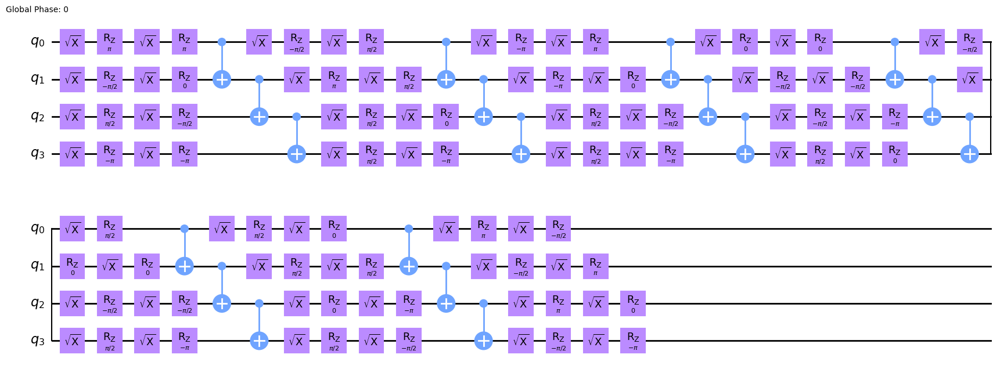

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.055961

Episode: 18287 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + linear
Raw Err: 0.007202 | Mit Err: 0.003142 | Rwd: 0.405971
Avg Raw (100): 0.033531
Avg Mit (100): 0.054015

Episode: 18288 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + linear
Raw Err: 0.001099 | Mit Err: 0.001071 | Rwd: 1.002790
Avg Raw (100): 0.033485
Avg Mit (100): 0.053976

Episode: 18289 | Stage: 4 | Reps: 6
Action: [1.0, 1.8, 2.6] + exponential
Raw Err: 0.012939 | Mit Err: 0.031128 | Rwd: -1.818848
Avg Raw (100): 0.031896
Avg Mit (100): 0.052632

Episode: 18290 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + linear
Raw Err: 0.012817 | Mit Err: 0.021334 | Rwd: -0.851702
Avg Raw (100): 0.031827
Avg Mit (100): 0.052757

Episode: 18291 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + linear
Raw Err: 0.008423 | Mit Err: 0.014715 | Rwd: -0.629185
Avg Raw (100): 0.031901
Avg Mit (100): 0.048559

Episode: 18292 | Stage: 4 | Reps: 6


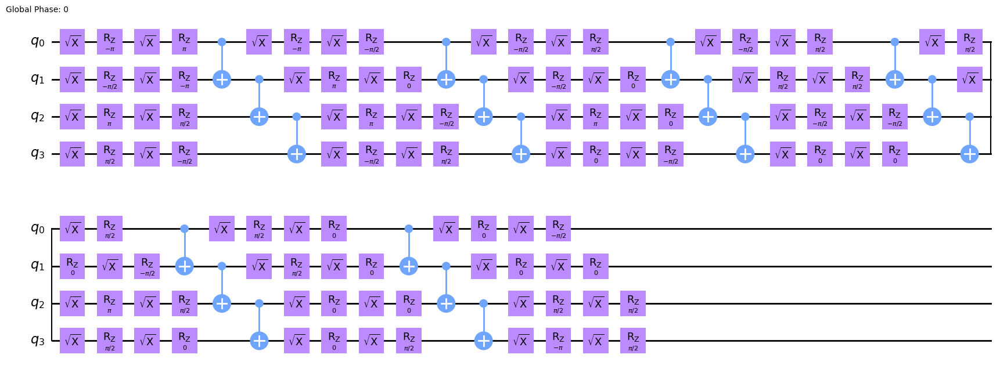

Streaming output truncated to the last 5000 lines.
Avg Mit (100): 0.057888

Episode: 19287 | Stage: 4 | Reps: 6
Action: [1.0, 1.2, 1.4, 1.6] + richardson
Raw Err: 0.007202 | Mit Err: 0.722656 | Rwd: -10.000000
Avg Raw (100): 0.051141
Avg Mit (100): 0.064913

Episode: 19288 | Stage: 4 | Reps: 6
Action: [1.0, 2.8, 4.6] + exponential
Raw Err: 0.001831 | Mit Err: 0.007568 | Rwd: -0.573730
Avg Raw (100): 0.049655
Avg Mit (100): 0.063956

Episode: 19289 | Stage: 4 | Reps: 6
Action: [1.0, 3.0, 4.0, 5.0] + exponential
Raw Err: 0.001709 | Mit Err: 0.014537 | Rwd: -1.282762
Avg Raw (100): 0.046378
Avg Mit (100): 0.060893

Episode: 19290 | Stage: 4 | Reps: 6
Action: [1.0, 2.8, 4.6] + exponential
Raw Err: 0.004395 | Mit Err: 0.016602 | Rwd: -1.220703
Avg Raw (100): 0.046093
Avg Mit (100): 0.060905

Episode: 19291 | Stage: 4 | Reps: 6
Action: [1.0, 2.8, 4.6] + exponential
Raw Err: 0.011963 | Mit Err: 0.034008 | Rwd: -2.204462
Avg Raw (100): 0.046011
Avg Mit (100): 0.061189

Episode: 19292 | Stage: 

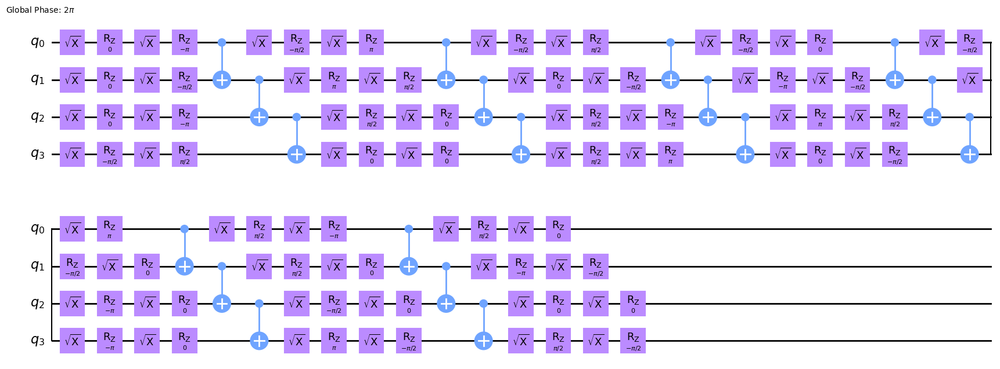

In [5]:
def train_agent_data_collection(env, agent, episodes=20000, curriculum_stages=4):
    ep_per_stage = episodes // curriculum_stages
    schedule = [(2, 4), (3, 4), (5, 4), (6, 4)]

    data = {
        'rewards': [],
        'mitigated_errors': [],
        'unmitigated_errors': [],
        'actions': [],
        'action_counts': defaultdict(int)
    }

    start_t = time.time()
    for ep in range(episodes):
        stage = min(ep // ep_per_stage, curriculum_stages - 1)
        reps, nq = schedule[stage]
        env.num_qubits = nq
        env.trotter_steps = reps

        state, _ = env.reset()
        action = agent.select_action(state, training=True)
        data['action_counts'][action] += 1

        next_state, reward, term, trunc, info = env.step(action)
        agent.store_transition(state, action, reward, next_state, term or trunc)
        agent.update(64)

        data['rewards'].append(reward)
        data['mitigated_errors'].append(info['error'])
        data['unmitigated_errors'].append(info['unmitigated_error'])
        data['actions'].append(action)

        n_ex = len(env.extrapolators)
        factors = env.noisefactor_options[action // n_ex]
        extrap = env.extrapolators[action % n_ex]

        print(f"\n{'='*60}")
        print(f"Episode: {ep+1} | Stage: {stage+1} | Reps: {reps}")
        print(f"Action: {factors} + {extrap}")
        print(f"Raw Err: {info['unmitigated_error']:.6f} | Mit Err: {info['error']:.6f} | Rwd: {reward:.6f}")

        if len(data['unmitigated_errors']) > 100:
            print(f"Avg Raw (100): {np.mean(data['unmitigated_errors'][-100:]):.6f}")
            print(f"Avg Mit (100): {np.mean(data['mitigated_errors'][-100:]):.6f}")

        if (ep + 1) % 1000 == 0:
            print("Current Circuit Topology:")
            fig = env.circuit.draw(output='mpl', style='clifford')
            display(fig)
            plt.close(fig)

    data['duration'] = (time.time() - start_t) / 60
    return data

training_data = train_agent_data_collection(env, agent, episodes=20000)

Training Duration: 258.64 mins


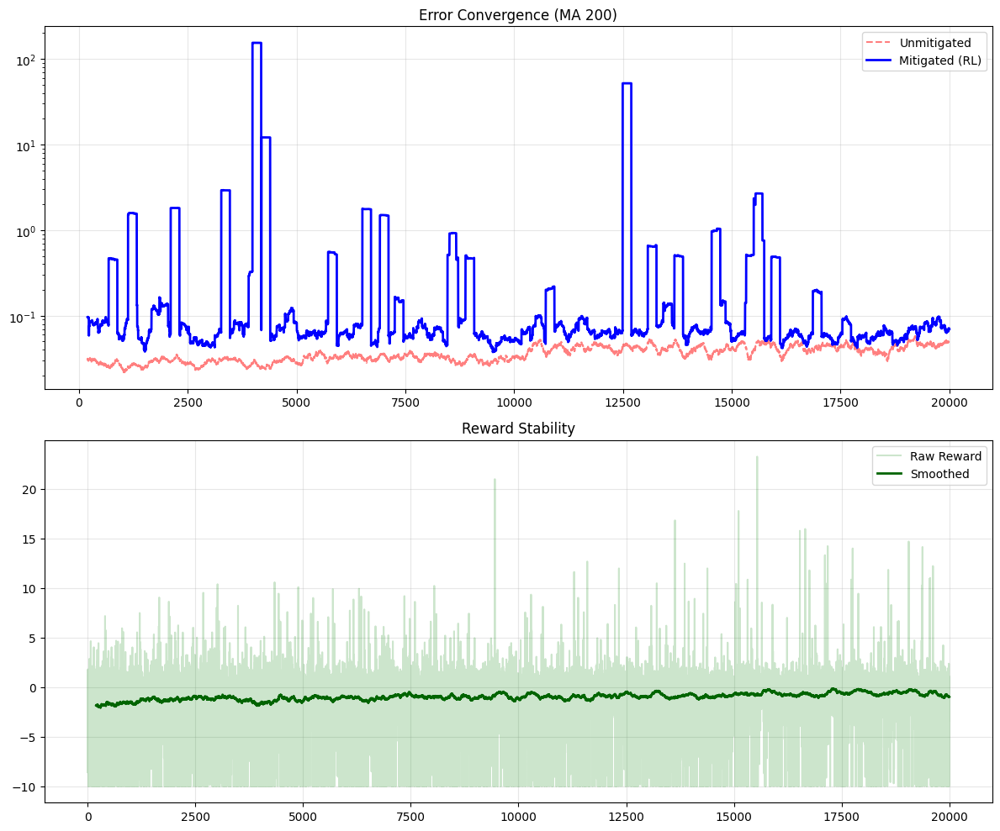


Top 20 Training Actions:
+------+---------------------------+----------------+---------+-----------+
|   ID | Factors                   | Extrapolator   |   Count | Usage %   |
+======+===========================+================+=========+===========+
|    3 | [1.0]                     | richardson     |    1125 | 5.62%     |
+------+---------------------------+----------------+---------+-----------+
|    1 | [1.0]                     | polynomial     |    1107 | 5.54%     |
+------+---------------------------+----------------+---------+-----------+
|   44 | [1.0, 2.0, 4.0]           | linear         |     852 | 4.26%     |
+------+---------------------------+----------------+---------+-----------+
|    0 | [1.0]                     | linear         |     736 | 3.68%     |
+------+---------------------------+----------------+---------+-----------+
|   56 | [1.0, 3.0, 4.0, 5.0]      | linear         |     705 | 3.52%     |
+------+---------------------------+----------------+---------

In [6]:
def visualize_training(data, env_obj):
    print(f"Training Duration: {data['duration']:.2f} mins")


    w = 200
    s_raw = pd.Series(data['unmitigated_errors']).rolling(w).mean()
    s_mit = pd.Series(data['mitigated_errors']).rolling(w).mean()
    s_rew = pd.Series(data['rewards']).rolling(w).mean()

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

    ax1.plot(s_raw, 'r--', alpha=0.5, label='Unmitigated')
    ax1.plot(s_mit, 'b', linewidth=2, label='Mitigated (RL)')
    ax1.set_title(f'Error Convergence (MA {w})')
    ax1.set_yscale('log')
    ax1.legend(); ax1.grid(alpha=0.3)

    ax2.plot(data['rewards'], 'g', alpha=0.2, label='Raw Reward')
    ax2.plot(s_rew, 'darkgreen', linewidth=2, label='Smoothed')
    ax2.set_title('Reward Stability')
    ax2.legend(); ax2.grid(alpha=0.3)
    plt.tight_layout(); plt.show()


    table_data = []
    n_ex = len(env_obj.extrapolators)
    sorted_acts = sorted(data['action_counts'].items(), key=lambda x: x[1], reverse=True)[:20]

    for aid, count in sorted_acts:
        fac = env_obj.noisefactor_options[aid // n_ex]
        ext = env_obj.extrapolators[aid % n_ex]
        pct = (count / len(data['actions'])) * 100
        table_data.append([aid, str(fac), ext, count, f"{pct:.2f}%"])

    print("\nTop 20 Training Actions:")
    print(tabulate(table_data, headers=["ID", "Factors", "Extrapolator", "Count", "Usage %"], tablefmt="grid"))

visualize_training(training_data, env)


Test Ep: 1 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.054688
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.081787
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.061859
Unmitigated:    [Raw Hardware]                           | Error: 0.092407
------------------------------------------------------------

Test Ep: 2 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.008667
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.007935
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.024796
Unmitigated:    [Raw Hardware]                           | Error: 0.008911
------------------------------------------------------------

Test Ep: 3 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + po

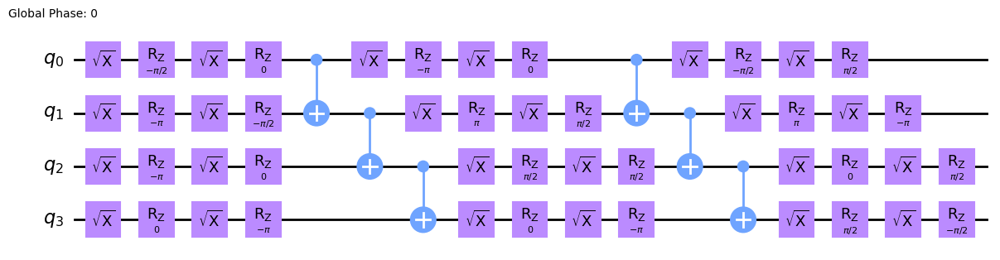


Test Ep: 101 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.006104
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.174316
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.002991
Unmitigated:    [Raw Hardware]                           | Error: 0.005127
------------------------------------------------------------
Avg Raw (100): 0.029169
Avg Ag (100):  0.030643

Test Ep: 102 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.009033
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.016235
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.016525
Unmitigated:    [Raw Hardware]                           | Error: 0.000488
------------------------------------------------------------
Avg Raw (100): 0.029084
Avg Ag (100):  0.030647

Test Ep: 

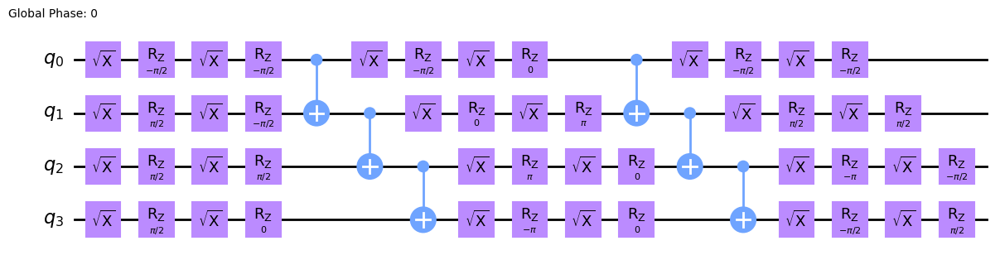


Test Ep: 201 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.016479
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.036377
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.008987
Unmitigated:    [Raw Hardware]                           | Error: 0.001831
------------------------------------------------------------
Avg Raw (100): 0.030138
Avg Ag (100):  0.028787

Test Ep: 202 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.007446
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.085327
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.012512
Unmitigated:    [Raw Hardware]                           | Error: 0.020020
------------------------------------------------------------
Avg Raw (100): 0.030333
Avg Ag (100):  0.028771

Test Ep: 

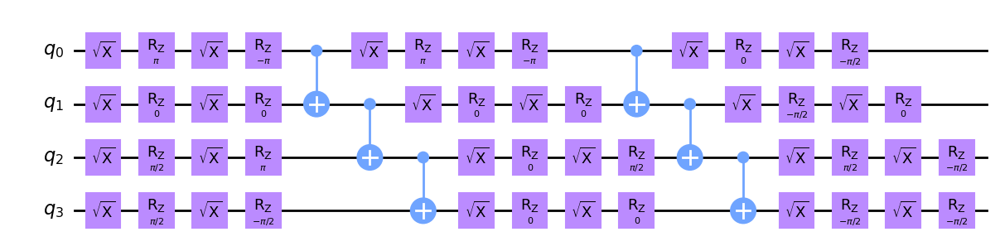


Test Ep: 301 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.012329
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.155396
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.007080
Unmitigated:    [Raw Hardware]                           | Error: 0.003540
------------------------------------------------------------
Avg Raw (100): 0.029189
Avg Ag (100):  0.028564

Test Ep: 302 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.074829
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.184448
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.077255
Unmitigated:    [Raw Hardware]                           | Error: 0.077393
------------------------------------------------------------
Avg Raw (100): 0.029763
Avg Ag (100):  0.029238

Test Ep: 

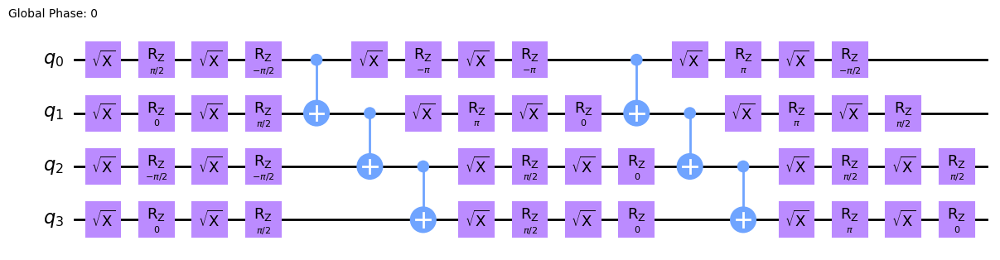


Test Ep: 401 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.038330
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.115845
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.022278
Unmitigated:    [Raw Hardware]                           | Error: 0.026855
------------------------------------------------------------
Avg Raw (100): 0.027162
Avg Ag (100):  0.027371

Test Ep: 402 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.006714
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.087402
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.020630
Unmitigated:    [Raw Hardware]                           | Error: 0.013428
------------------------------------------------------------
Avg Raw (100): 0.026522
Avg Ag (100):  0.026689

Test Ep: 

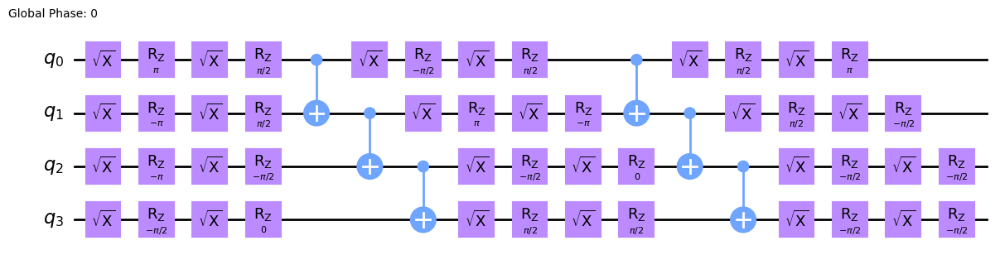


Test Ep: 501 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.005493
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.044556
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.003342
Unmitigated:    [Raw Hardware]                           | Error: 0.007935
------------------------------------------------------------
Avg Raw (100): 0.030460
Avg Ag (100):  0.030377

Test Ep: 502 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.010864
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.280884
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.021545
Unmitigated:    [Raw Hardware]                           | Error: 0.002563
------------------------------------------------------------
Avg Raw (100): 0.030352
Avg Ag (100):  0.030419

Test Ep: 

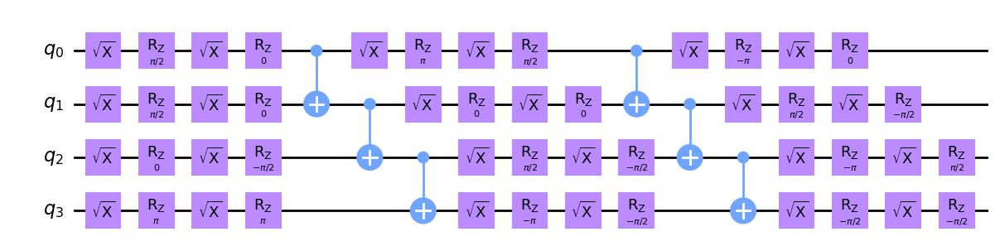


Test Ep: 601 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.024658
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.068237
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.017883
Unmitigated:    [Raw Hardware]                           | Error: 0.022705
------------------------------------------------------------
Avg Raw (100): 0.029318
Avg Ag (100):  0.029808

Test Ep: 602 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.089111
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.020996
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.054337
Unmitigated:    [Raw Hardware]                           | Error: 0.089844
------------------------------------------------------------
Avg Raw (100): 0.030190
Avg Ag (100):  0.030591

Test Ep: 

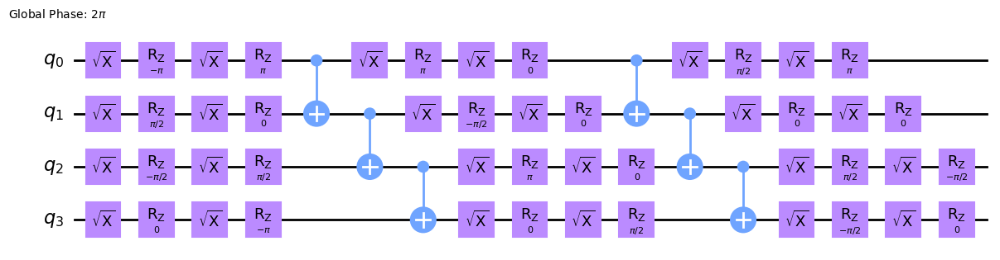


Test Ep: 701 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.001587
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.105713
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.003998
Unmitigated:    [Raw Hardware]                           | Error: 0.009399
------------------------------------------------------------
Avg Raw (100): 0.032490
Avg Ag (100):  0.033271

Test Ep: 702 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.005005
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.022705
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.009949
Unmitigated:    [Raw Hardware]                           | Error: 0.020386
------------------------------------------------------------
Avg Raw (100): 0.031796
Avg Ag (100):  0.032430

Test Ep: 

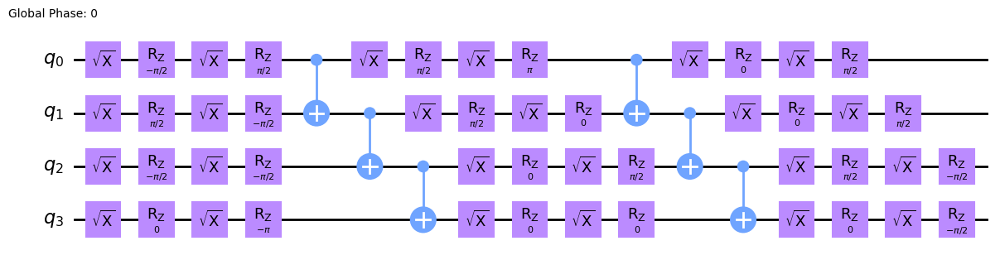


Test Ep: 801 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.007202
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.070557
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.009613
Unmitigated:    [Raw Hardware]                           | Error: 0.001465
------------------------------------------------------------
Avg Raw (100): 0.027452
Avg Ag (100):  0.027686

Test Ep: 802 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.007446
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.181519
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.001266
Unmitigated:    [Raw Hardware]                           | Error: 0.009644
------------------------------------------------------------
Avg Raw (100): 0.027345
Avg Ag (100):  0.027710

Test Ep: 

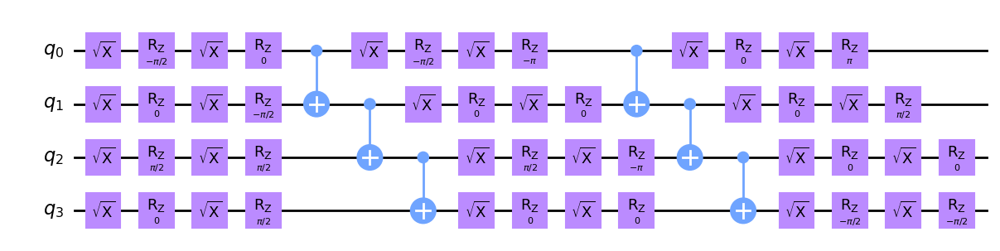


Test Ep: 901 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.069092
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.082275
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.048950
Unmitigated:    [Raw Hardware]                           | Error: 0.074463
------------------------------------------------------------
Avg Raw (100): 0.030273
Avg Ag (100):  0.029373

Test Ep: 902 | Stage: 1
------------------------------------------------------------
Agent Action:   [1.0] + polynomial                       | Error: 0.008911
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.039795
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.040100
Unmitigated:    [Raw Hardware]                           | Error: 0.027100
------------------------------------------------------------
Avg Raw (100): 0.030448
Avg Ag (100):  0.029387

Test Ep: 

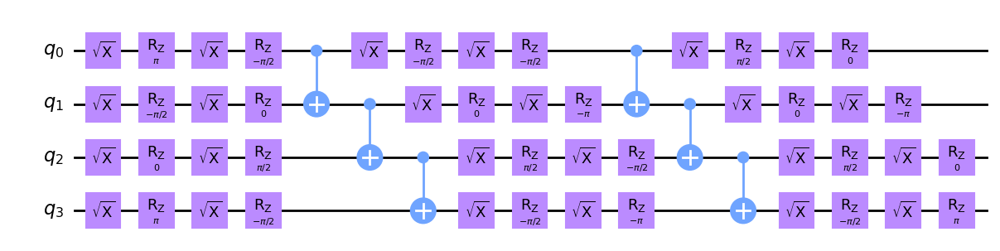


Test Ep: 1001 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.098755
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.129639
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.090530
Unmitigated:    [Raw Hardware]                           | Error: 0.095825
------------------------------------------------------------
Avg Raw (100): 0.026488
Avg Ag (100):  0.027618

Test Ep: 1002 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.007507
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.035034
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.018677
Unmitigated:    [Raw Hardware]                           | Error: 0.016113
------------------------------------------------------------
Avg Raw (100): 0.026378
Avg Ag (100):  0.027604

Test Ep

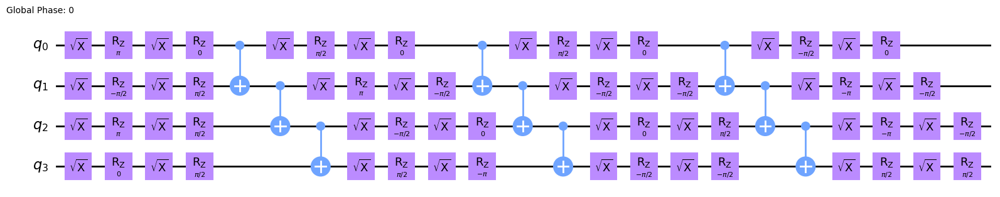


Test Ep: 1101 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.003357
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.016968
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.013016
Unmitigated:    [Raw Hardware]                           | Error: 0.009888
------------------------------------------------------------
Avg Raw (100): 0.017340
Avg Ag (100):  0.019817

Test Ep: 1102 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.003357
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.202881
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.017868
Unmitigated:    [Raw Hardware]                           | Error: 0.005737
------------------------------------------------------------
Avg Raw (100): 0.017236
Avg Ag (100):  0.019775

Test Ep

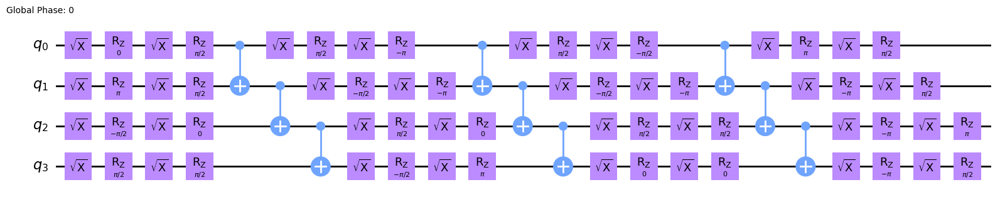


Test Ep: 1201 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.133057
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.241211
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.130859
Unmitigated:    [Raw Hardware]                           | Error: 0.111206
------------------------------------------------------------
Avg Raw (100): 0.037972
Avg Ag (100):  0.037356

Test Ep: 1202 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.017578
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.001587
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.044632
Unmitigated:    [Raw Hardware]                           | Error: 0.021362
------------------------------------------------------------
Avg Raw (100): 0.038129
Avg Ag (100):  0.037498

Test Ep

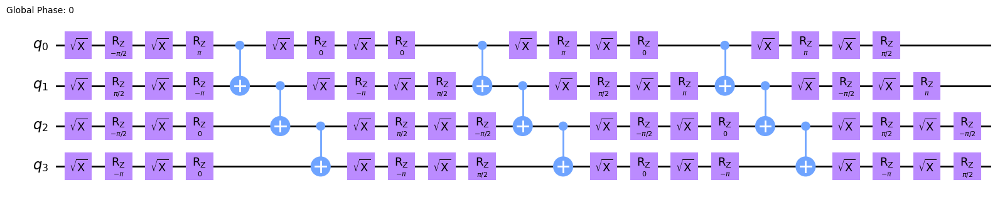


Test Ep: 1301 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.106384
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.037842
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.122025
Unmitigated:    [Raw Hardware]                           | Error: 0.102783
------------------------------------------------------------
Avg Raw (100): 0.037806
Avg Ag (100):  0.039218

Test Ep: 1302 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.003418
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.019287
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.012497
Unmitigated:    [Raw Hardware]                           | Error: 0.013184
------------------------------------------------------------
Avg Raw (100): 0.037725
Avg Ag (100):  0.039076

Test Ep

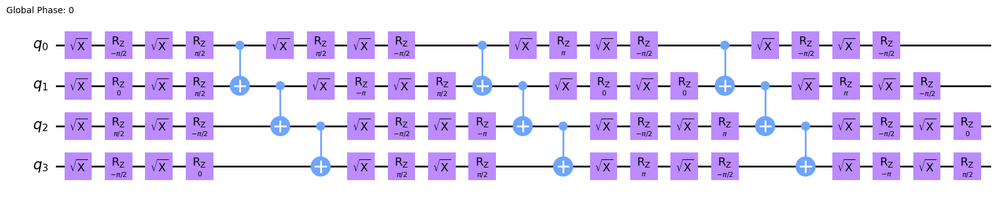


Test Ep: 1401 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.019958
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.140869
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.010620
Unmitigated:    [Raw Hardware]                           | Error: 0.000854
------------------------------------------------------------
Avg Raw (100): 0.033295
Avg Ag (100):  0.032654

Test Ep: 1402 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.011230
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.038452
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.024628
Unmitigated:    [Raw Hardware]                           | Error: 0.007935
------------------------------------------------------------
Avg Raw (100): 0.033242
Avg Ag (100):  0.032733

Test Ep

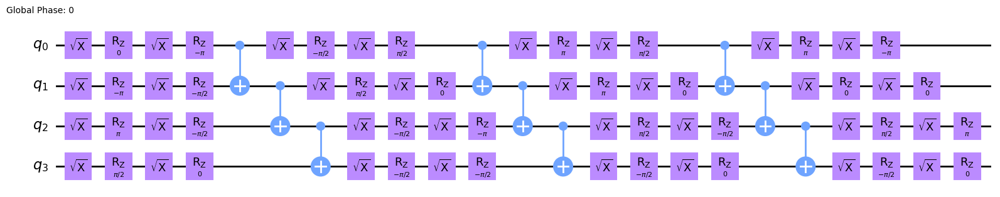


Test Ep: 1501 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.004700
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.154785
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.016312
Unmitigated:    [Raw Hardware]                           | Error: 0.005493
------------------------------------------------------------
Avg Raw (100): 0.030809
Avg Ag (100):  0.030633

Test Ep: 1502 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.129822
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.132080
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.103394
Unmitigated:    [Raw Hardware]                           | Error: 0.122559
------------------------------------------------------------
Avg Raw (100): 0.031956
Avg Ag (100):  0.031819

Test Ep

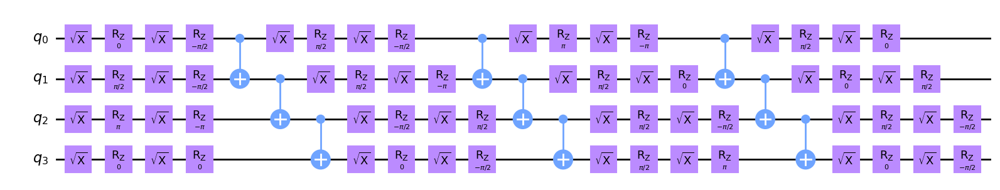


Test Ep: 1601 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000916
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.109741
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.012573
Unmitigated:    [Raw Hardware]                           | Error: 0.014404
------------------------------------------------------------
Avg Raw (100): 0.034169
Avg Ag (100):  0.033802

Test Ep: 1602 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.001953
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.056885
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.002243
Unmitigated:    [Raw Hardware]                           | Error: 0.012817
------------------------------------------------------------
Avg Raw (100): 0.033071
Avg Ag (100):  0.032523

Test Ep

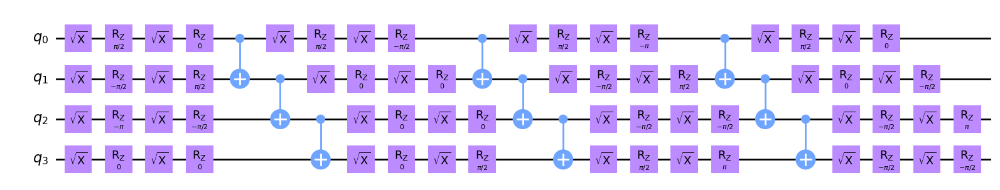


Test Ep: 1701 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000549
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.094971
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.036041
Unmitigated:    [Raw Hardware]                           | Error: 0.001709
------------------------------------------------------------
Avg Raw (100): 0.031115
Avg Ag (100):  0.030507

Test Ep: 1702 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000488
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.161621
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.014481
Unmitigated:    [Raw Hardware]                           | Error: 0.006104
------------------------------------------------------------
Avg Raw (100): 0.031047
Avg Ag (100):  0.030493

Test Ep

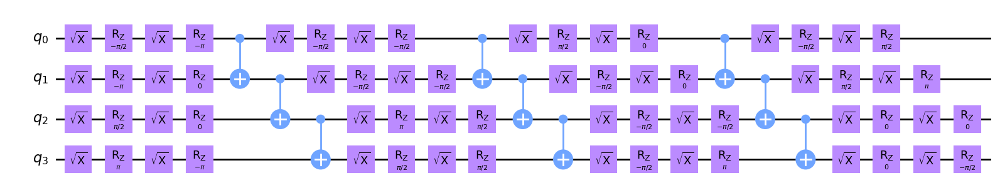


Test Ep: 1801 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.006836
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.028564
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.027161
Unmitigated:    [Raw Hardware]                           | Error: 0.004028
------------------------------------------------------------
Avg Raw (100): 0.043922
Avg Ag (100):  0.044879

Test Ep: 1802 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.015869
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.048462
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.011993
Unmitigated:    [Raw Hardware]                           | Error: 0.001221
------------------------------------------------------------
Avg Raw (100): 0.043873
Avg Ag (100):  0.045033

Test Ep

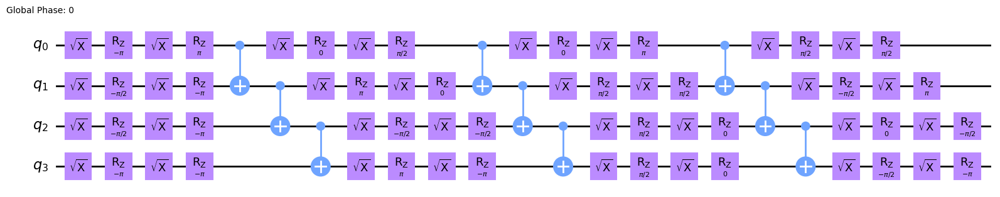


Test Ep: 1901 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.008179
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.108276
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.024612
Unmitigated:    [Raw Hardware]                           | Error: 0.013916
------------------------------------------------------------
Avg Raw (100): 0.030748
Avg Ag (100):  0.030811

Test Ep: 1902 | Stage: 2
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.084595
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.109253
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.078873
Unmitigated:    [Raw Hardware]                           | Error: 0.095947
------------------------------------------------------------
Avg Raw (100): 0.031696
Avg Ag (100):  0.031498

Test Ep

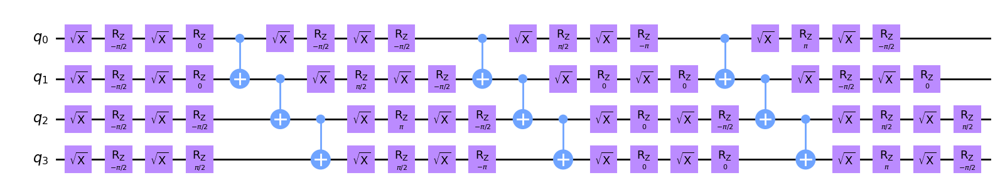


Test Ep: 2001 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.025024
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.131592
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.007980
Unmitigated:    [Raw Hardware]                           | Error: 0.001709
------------------------------------------------------------
Avg Raw (100): 0.031555
Avg Ag (100):  0.034995

Test Ep: 2002 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.002136
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.043213
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.023560
Unmitigated:    [Raw Hardware]                           | Error: 0.003174
------------------------------------------------------------
Avg Raw (100): 0.030627
Avg Ag (100):  0.034171

Test Ep

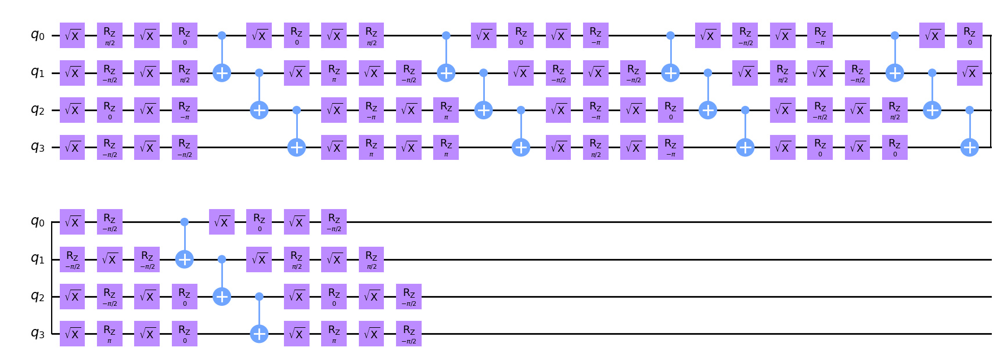


Test Ep: 2101 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.004333
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.060181
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.002151
Unmitigated:    [Raw Hardware]                           | Error: 0.013916
------------------------------------------------------------
Avg Raw (100): 0.044379
Avg Ag (100):  0.043560

Test Ep: 2102 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.009277
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.017212
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.014389
Unmitigated:    [Raw Hardware]                           | Error: 0.002930
------------------------------------------------------------
Avg Raw (100): 0.044376
Avg Ag (100):  0.043632

Test Ep

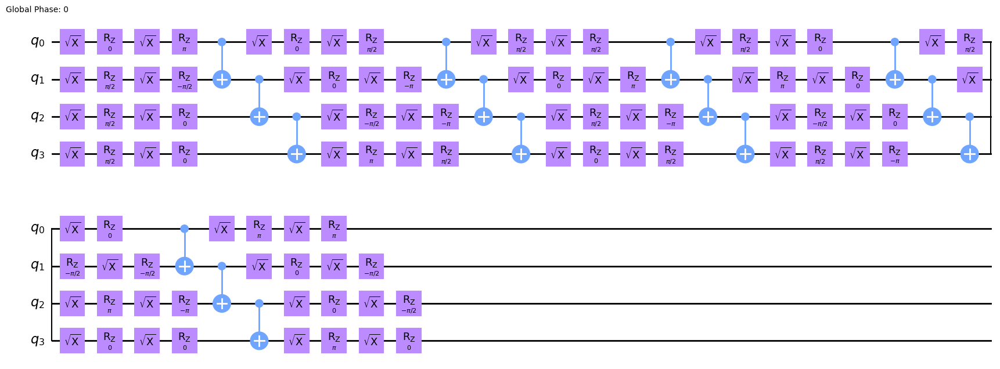


Test Ep: 2201 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.001831
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.223389
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.002121
Unmitigated:    [Raw Hardware]                           | Error: 0.012573
------------------------------------------------------------
Avg Raw (100): 0.039882
Avg Ag (100):  0.041521

Test Ep: 2202 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.156494
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.066772
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.158844
Unmitigated:    [Raw Hardware]                           | Error: 0.166382
------------------------------------------------------------
Avg Raw (100): 0.041516
Avg Ag (100):  0.042993

Test Ep

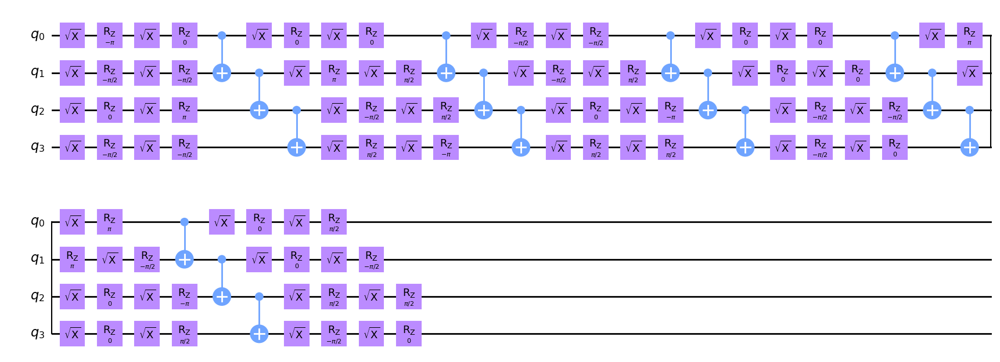


Test Ep: 2301 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.018738
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.041016
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.010056
Unmitigated:    [Raw Hardware]                           | Error: 0.017822
------------------------------------------------------------
Avg Raw (100): 0.054398
Avg Ag (100):  0.053583

Test Ep: 2302 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.002258
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.029053
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.004807
Unmitigated:    [Raw Hardware]                           | Error: 0.004028
------------------------------------------------------------
Avg Raw (100): 0.052775
Avg Ag (100):  0.052041

Test Ep

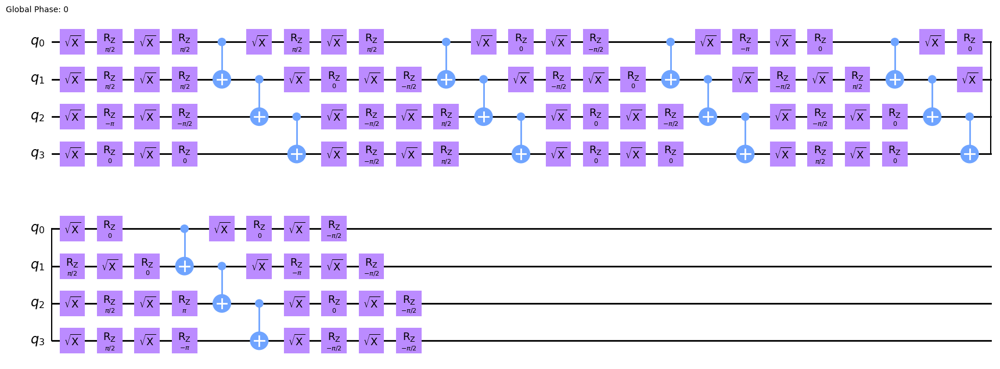


Test Ep: 2401 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.018799
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.004272
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.043671
Unmitigated:    [Raw Hardware]                           | Error: 0.014526
------------------------------------------------------------
Avg Raw (100): 0.038281
Avg Ag (100):  0.038711

Test Ep: 2402 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.015686
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.043091
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.016953
Unmitigated:    [Raw Hardware]                           | Error: 0.010376
------------------------------------------------------------
Avg Raw (100): 0.038345
Avg Ag (100):  0.038845

Test Ep

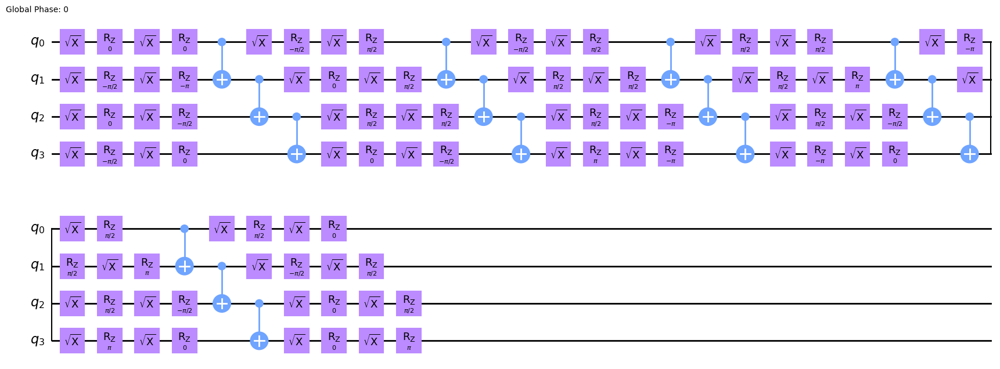


Test Ep: 2501 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.015137
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.098999
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.016235
Unmitigated:    [Raw Hardware]                           | Error: 0.005371
------------------------------------------------------------
Avg Raw (100): 0.036715
Avg Ag (100):  0.037958

Test Ep: 2502 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000183
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.006104
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.027603
Unmitigated:    [Raw Hardware]                           | Error: 0.014282
------------------------------------------------------------
Avg Raw (100): 0.036754
Avg Ag (100):  0.037803

Test Ep

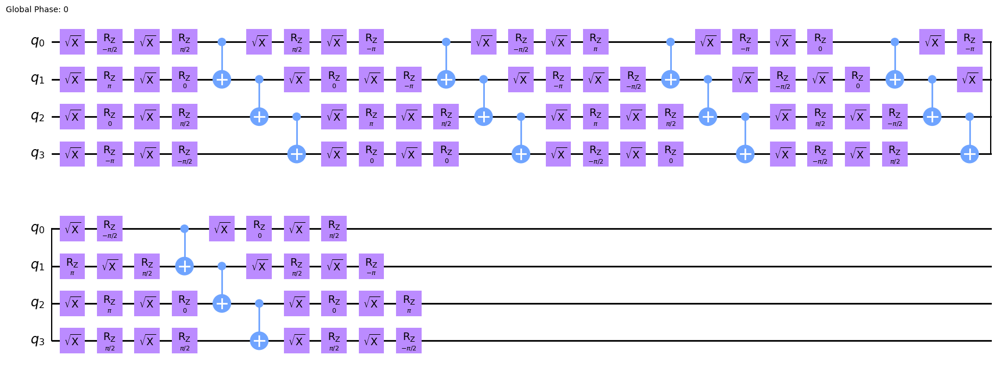


Test Ep: 2601 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.013977
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.040527
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.015411
Unmitigated:    [Raw Hardware]                           | Error: 0.005127
------------------------------------------------------------
Avg Raw (100): 0.057849
Avg Ag (100):  0.057572

Test Ep: 2602 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.011475
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.105957
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.021851
Unmitigated:    [Raw Hardware]                           | Error: 0.006958
------------------------------------------------------------
Avg Raw (100): 0.057776
Avg Ag (100):  0.057685

Test Ep

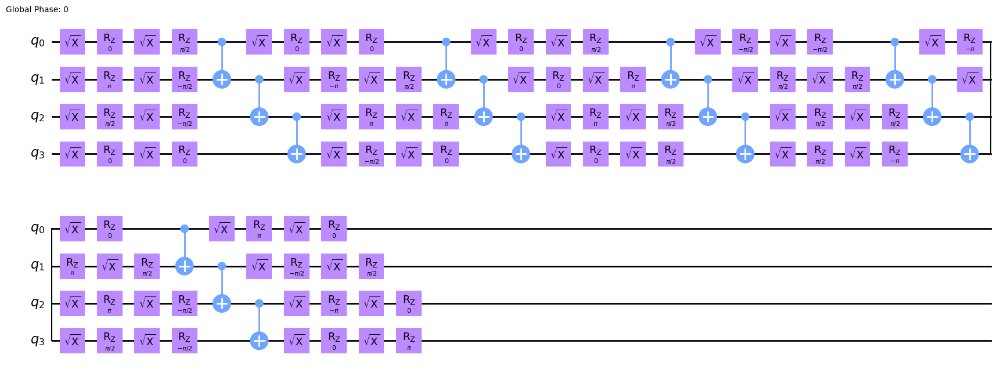


Test Ep: 2701 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.002502
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.026001
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.016846
Unmitigated:    [Raw Hardware]                           | Error: 0.002686
------------------------------------------------------------
Avg Raw (100): 0.047144
Avg Ag (100):  0.048812

Test Ep: 2702 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.007813
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.122437
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.029495
Unmitigated:    [Raw Hardware]                           | Error: 0.018677
------------------------------------------------------------
Avg Raw (100): 0.047261
Avg Ag (100):  0.048776

Test Ep

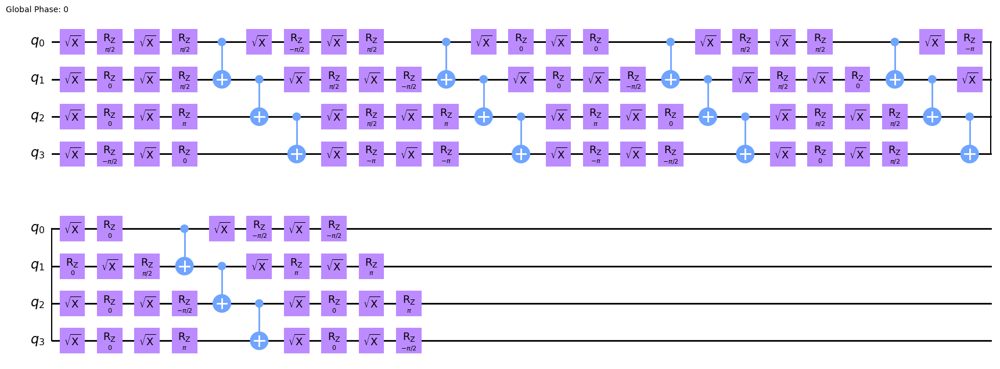


Test Ep: 2801 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.012634
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.000732
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.000046
Unmitigated:    [Raw Hardware]                           | Error: 0.048340
------------------------------------------------------------
Avg Raw (100): 0.040354
Avg Ag (100):  0.041609

Test Ep: 2802 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.016296
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.019165
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.010284
Unmitigated:    [Raw Hardware]                           | Error: 0.010864
------------------------------------------------------------
Avg Raw (100): 0.040276
Avg Ag (100):  0.041694

Test Ep

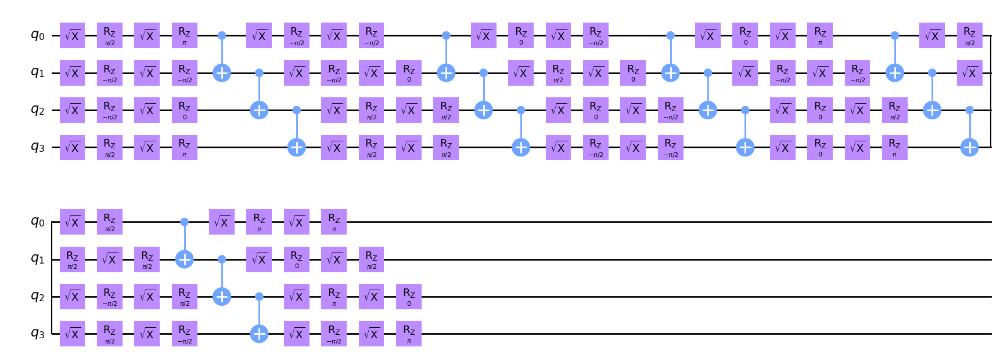


Test Ep: 2901 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.170166
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.245972
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.167877
Unmitigated:    [Raw Hardware]                           | Error: 0.177368
------------------------------------------------------------
Avg Raw (100): 0.057313
Avg Ag (100):  0.059684

Test Ep: 2902 | Stage: 3
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.002075
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.072876
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.000839
Unmitigated:    [Raw Hardware]                           | Error: 0.000122
------------------------------------------------------------
Avg Raw (100): 0.057206
Avg Ag (100):  0.059542

Test Ep

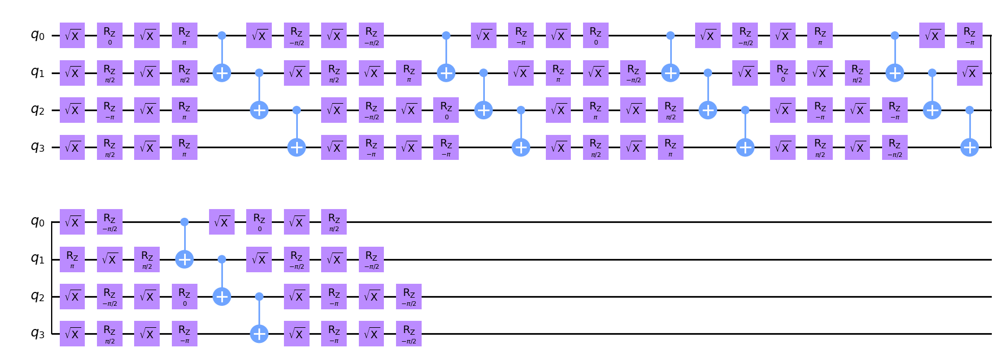


Test Ep: 3001 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.297852
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.430786
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.317093
Unmitigated:    [Raw Hardware]                           | Error: 0.291138
------------------------------------------------------------
Avg Raw (100): 0.041367
Avg Ag (100):  0.042139

Test Ep: 3002 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.010681
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.115112
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.004852
Unmitigated:    [Raw Hardware]                           | Error: 0.004272
------------------------------------------------------------
Avg Raw (100): 0.041409
Avg Ag (100):  0.042225

Test Ep

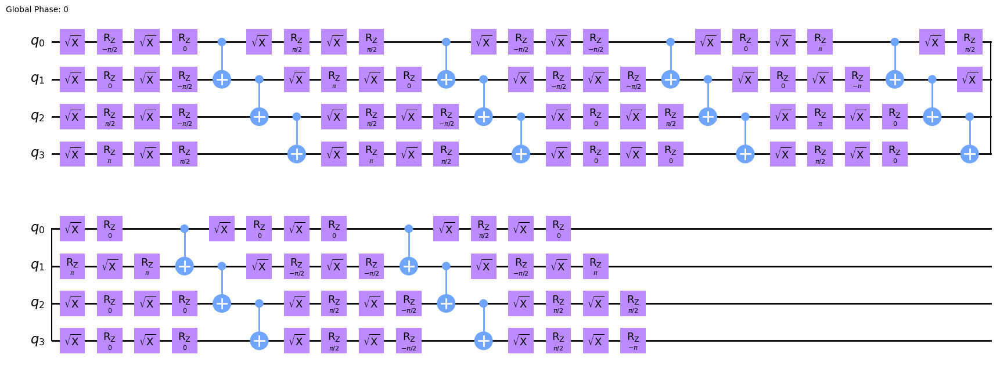


Test Ep: 3101 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.017639
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.053955
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.006561
Unmitigated:    [Raw Hardware]                           | Error: 0.000977
------------------------------------------------------------
Avg Raw (100): 0.038165
Avg Ag (100):  0.037807

Test Ep: 3102 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.080811
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.009277
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.081909
Unmitigated:    [Raw Hardware]                           | Error: 0.094727
------------------------------------------------------------
Avg Raw (100): 0.039070
Avg Ag (100):  0.038508

Test Ep

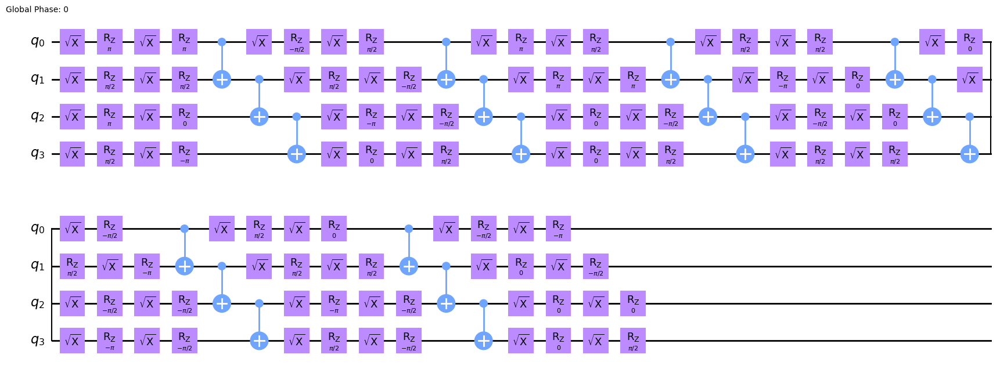


Test Ep: 3201 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.003540
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.085449
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.004929
Unmitigated:    [Raw Hardware]                           | Error: 0.012817
------------------------------------------------------------
Avg Raw (100): 0.040680
Avg Ag (100):  0.040148

Test Ep: 3202 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.004700
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.114258
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.033661
Unmitigated:    [Raw Hardware]                           | Error: 0.018188
------------------------------------------------------------
Avg Raw (100): 0.039915
Avg Ag (100):  0.039387

Test Ep

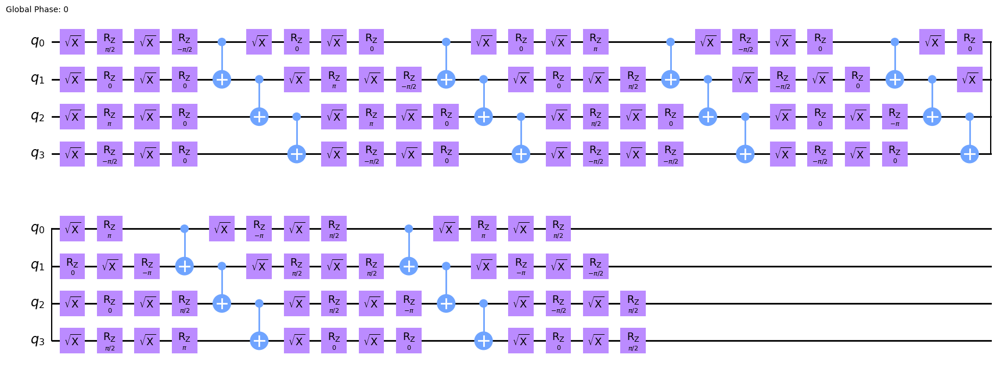


Test Ep: 3301 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.008972
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.119385
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.034653
Unmitigated:    [Raw Hardware]                           | Error: 0.020508
------------------------------------------------------------
Avg Raw (100): 0.037806
Avg Ag (100):  0.039423

Test Ep: 3302 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000244
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.063843
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.038589
Unmitigated:    [Raw Hardware]                           | Error: 0.002197
------------------------------------------------------------
Avg Raw (100): 0.037646
Avg Ag (100):  0.039379

Test Ep

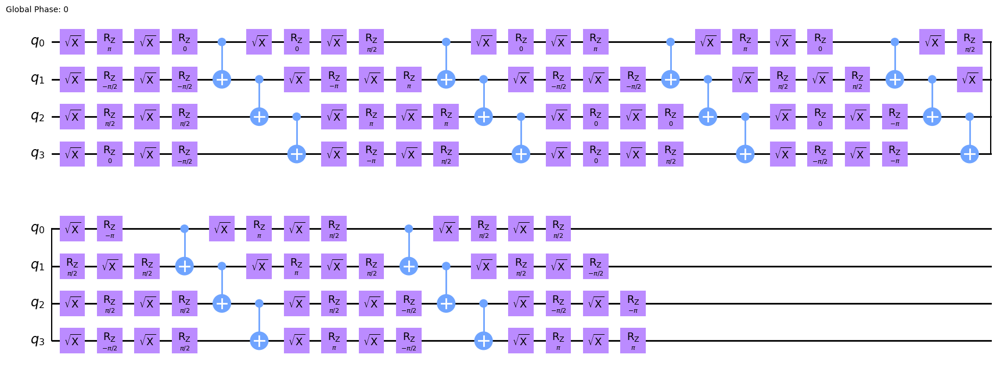


Test Ep: 3401 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.005859
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.000977
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.000061
Unmitigated:    [Raw Hardware]                           | Error: 0.019775
------------------------------------------------------------
Avg Raw (100): 0.042982
Avg Ag (100):  0.044327

Test Ep: 3402 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.006836
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.050171
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.010468
Unmitigated:    [Raw Hardware]                           | Error: 0.001343
------------------------------------------------------------
Avg Raw (100): 0.042974
Avg Ag (100):  0.044393

Test Ep

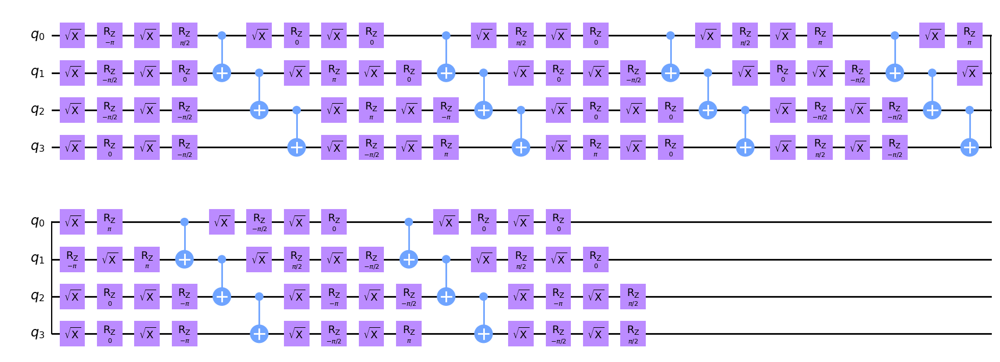


Test Ep: 3501 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.182617
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.153442
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.139465
Unmitigated:    [Raw Hardware]                           | Error: 0.155151
------------------------------------------------------------
Avg Raw (100): 0.048665
Avg Ag (100):  0.048098

Test Ep: 3502 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.299316
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.160156
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.304810
Unmitigated:    [Raw Hardware]                           | Error: 0.300293
------------------------------------------------------------
Avg Raw (100): 0.051654
Avg Ag (100):  0.051022

Test Ep

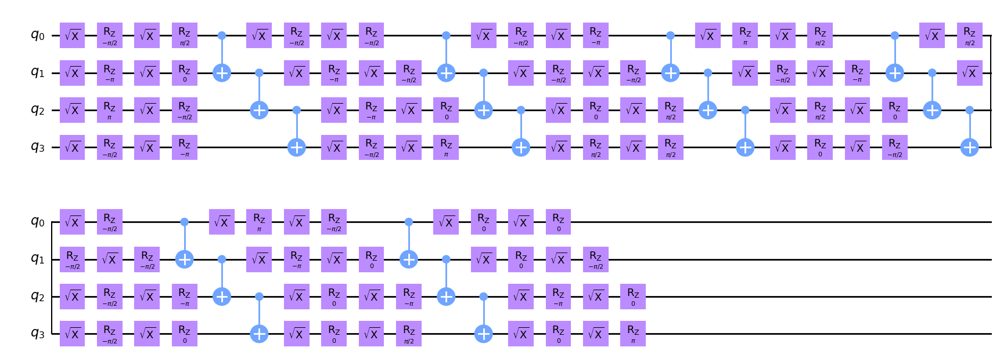


Test Ep: 3601 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.011780
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.113403
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.026230
Unmitigated:    [Raw Hardware]                           | Error: 0.014038
------------------------------------------------------------
Avg Raw (100): 0.042026
Avg Ag (100):  0.043240

Test Ep: 3602 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.170349
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.293091
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.196976
Unmitigated:    [Raw Hardware]                           | Error: 0.180908
------------------------------------------------------------
Avg Raw (100): 0.040833
Avg Ag (100):  0.041950

Test Ep

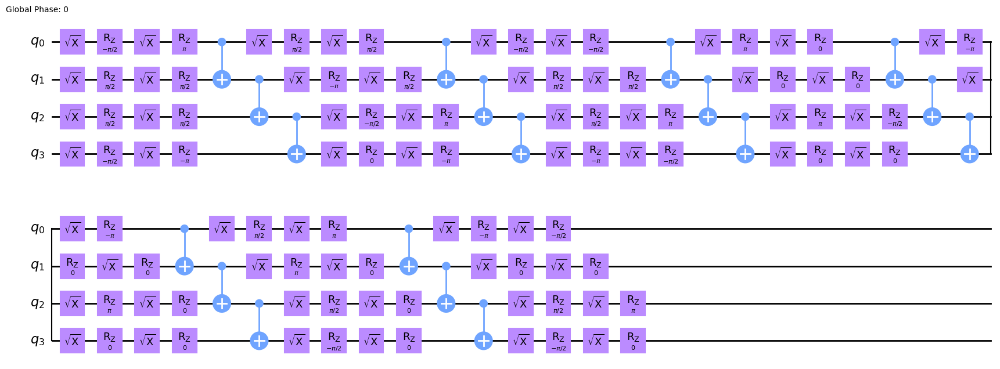


Test Ep: 3701 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.013489
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.007690
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.019211
Unmitigated:    [Raw Hardware]                           | Error: 0.000732
------------------------------------------------------------
Avg Raw (100): 0.041177
Avg Ag (100):  0.042491

Test Ep: 3702 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000183
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.055176
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.002121
Unmitigated:    [Raw Hardware]                           | Error: 0.003540
------------------------------------------------------------
Avg Raw (100): 0.039403
Avg Ag (100):  0.040789

Test Ep

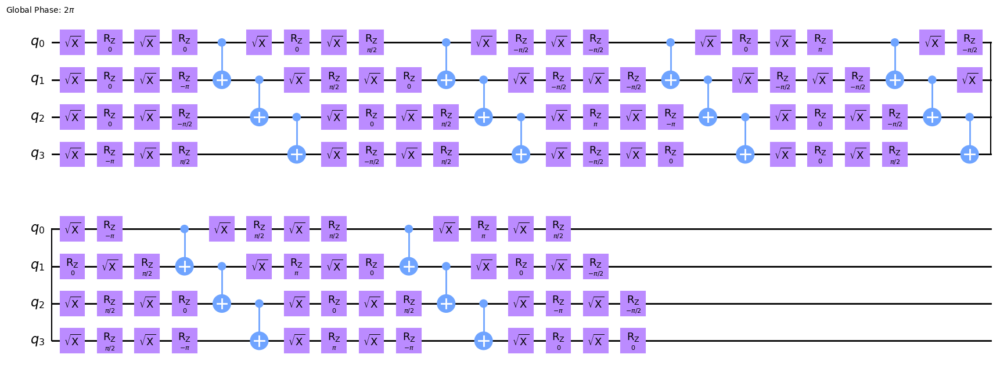


Test Ep: 3801 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.009460
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.019897
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.003281
Unmitigated:    [Raw Hardware]                           | Error: 0.008179
------------------------------------------------------------
Avg Raw (100): 0.038441
Avg Ag (100):  0.037552

Test Ep: 3802 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.021973
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.105103
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.006119
Unmitigated:    [Raw Hardware]                           | Error: 0.020996
------------------------------------------------------------
Avg Raw (100): 0.038616
Avg Ag (100):  0.037770

Test Ep

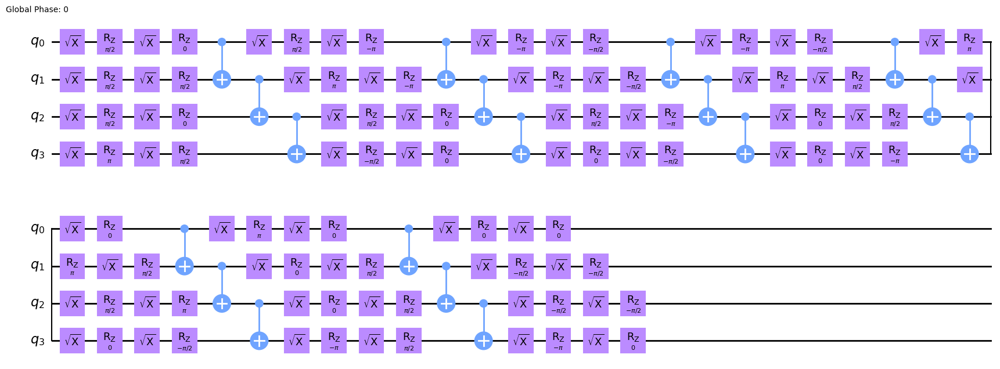


Test Ep: 3901 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.193787
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.235718
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.172592
Unmitigated:    [Raw Hardware]                           | Error: 0.181152
------------------------------------------------------------
Avg Raw (100): 0.033792
Avg Ag (100):  0.036511

Test Ep: 3902 | Stage: 4
------------------------------------------------------------
Agent Action:   [1.0, 2.0, 3.0, 4.0] + linear            | Error: 0.000427
Baseline Std:   [1.0, 1.5, 2.0] + richardson             | Error: 0.151367
Baseline Agg:   [1.0, 3.0, 5.0] + richardson             | Error: 0.020233
Unmitigated:    [Raw Hardware]                           | Error: 0.013550
------------------------------------------------------------
Avg Raw (100): 0.033717
Avg Ag (100):  0.036296

Test Ep

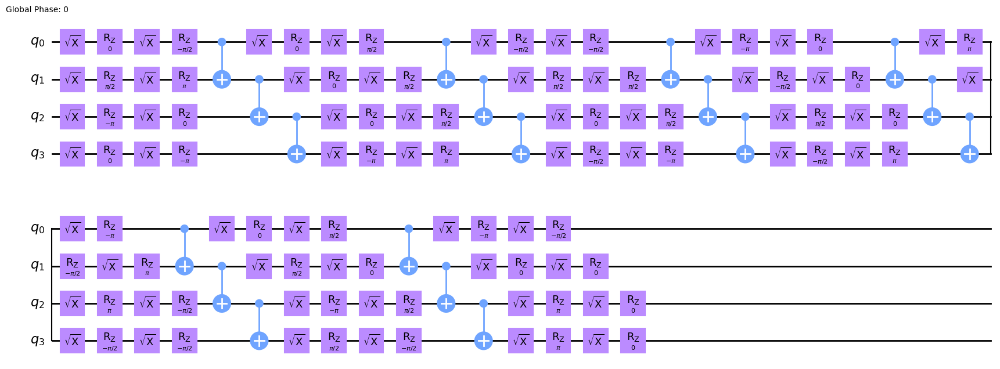

In [7]:
def test_agent_data_collection(env, agent, episodes=4000, curriculum_stages=4):
    agent.epsilon = 0.0
    ep_per_stage = episodes // curriculum_stages
    schedule = [(2, 4), (3, 4), (5, 4), (6, 4)]

    data = {
        'agent_err': [], 'raw_err': [],
        'base_std': [], 'base_agg': [], 'base_fine': [],
        'actions': [], 'action_counts': defaultdict(int)
    }


    # Index 1: [1.0, 1.5, 2.0]
    IDX_STD = 1 * 4 + 3
    # Index 4: [1.0, 3.0, 5.0]
    IDX_AGG = 4 * 4 + 3
    # Index 0: [1.0]
    IDX_ID = 0


    def decode_act(a_idx):
        n_ex = len(env.extrapolators)
        f = env.noisefactor_options[a_idx // n_ex]
        e = env.extrapolators[a_idx % n_ex]
        return f"{f} + {e}"

    str_std = decode_act(IDX_STD)
    str_agg = decode_act(IDX_AGG)

    start_t = time.time()
    for ep in range(episodes):
        stage = min(ep // ep_per_stage, curriculum_stages - 1)
        reps, nq = schedule[stage]
        env.num_qubits, env.trotter_steps = nq, reps

        state, _ = env.reset()


        act = agent.select_action(state, training=False)
        data['action_counts'][act] += 1
        data['actions'].append(act)
        _, _, _, _, i_ag = env.step(act)
        _, _, _, _, i_id = env.step(IDX_ID)
        _, _, _, _, i_std = env.step(IDX_STD)
        _, _, _, _, i_agg = env.step(IDX_AGG)

        data['agent_err'].append(i_ag['error'])
        data['raw_err'].append(i_ag['unmitigated_error'])
        data['base_std'].append(i_std['error'])
        data['base_agg'].append(i_agg['error'])
        data['base_fine'].append(i_id['error'])


        str_agent = decode_act(act)

        print(f"\n{'='*60}")
        print(f"Test Ep: {ep+1} | Stage: {stage+1}")
        print("-" * 60)
        print(f"Agent Action:   {str_agent:<40} | Error: {i_ag['error']:.6f}")
        print(f"Baseline Std:   {str_std:<40} | Error: {i_std['error']:.6f}")
        print(f"Baseline Agg:   {str_agg:<40} | Error: {i_agg['error']:.6f}")
        print(f"Unmitigated:    {'[Raw Hardware]':<40} | Error: {i_ag['unmitigated_error']:.6f}")
        print("-" * 60)

        if len(data['agent_err']) > 100:
             print(f"Avg Raw (100): {np.mean(data['raw_err'][-100:]):.6f}")
             print(f"Avg Ag (100):  {np.mean(data['agent_err'][-100:]):.6f}")

        if (ep + 1) % 500 == 0:
            print("Current Circuit Topology:")
            fig = env.circuit.draw(output='mpl', style='clifford')
            display(fig)
            plt.close(fig)

    data['duration'] = (time.time() - start_t) / 60
    return data

testing_data = test_agent_data_collection(env, agent, episodes=4000)

Test Duration: 129.29 mins
Mean Agent Err: 0.0374 | Mean Std Baseline: 0.0816
Improvement: +54.21%


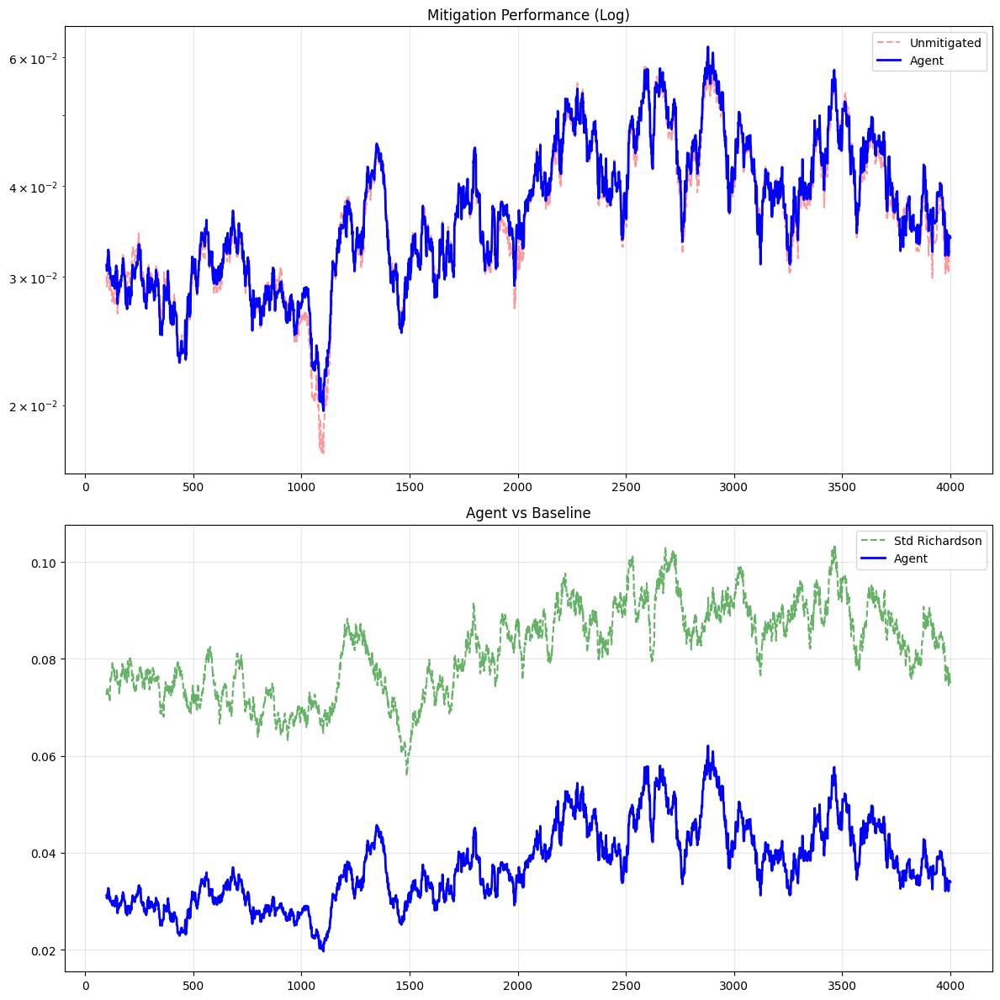


Top 20 Test Actions:
+------+----------------------+----------------+---------+-----------+
|   ID | Factors              | Extrapolator   |   Count | Usage %   |
+======+======================+================+=========+===========+
|   20 | [1.0, 2.0, 3.0, 4.0] | linear         |    3000 | 75.00%    |
+------+----------------------+----------------+---------+-----------+
|    1 | [1.0]                | polynomial     |    1000 | 25.00%    |
+------+----------------------+----------------+---------+-----------+


In [8]:
def visualize_testing(data, env_obj):
    print(f"Test Duration: {data['duration']:.2f} mins")

    ag_mean = np.mean(data['agent_err'])
    std_mean = np.mean(data['base_std'])
    imp = (std_mean - ag_mean) / std_mean * 100
    print(f"Mean Agent Err: {ag_mean:.4f} | Mean Std Baseline: {std_mean:.4f}")
    print(f"Improvement: {imp:+.2f}%")

    w = 100
    s_ag = pd.Series(data['agent_err']).rolling(w).mean()
    s_raw = pd.Series(data['raw_err']).rolling(w).mean()
    s_std = pd.Series(data['base_std']).rolling(w).mean()

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

    ax1.plot(s_raw, 'r--', alpha=0.4, label='Unmitigated')
    ax1.plot(s_ag, 'b', linewidth=2, label='Agent')
    ax1.set_title('Mitigation Performance (Log)')
    ax1.set_yscale('log'); ax1.legend(); ax1.grid(alpha=0.3)

    ax2.plot(s_std, 'g--', alpha=0.6, label='Std Richardson')
    ax2.plot(s_ag, 'b', linewidth=2, label='Agent')
    ax2.set_title('Agent vs Baseline')
    ax2.legend(); ax2.grid(alpha=0.3)
    plt.tight_layout(); plt.show()

    table_data = []
    n_ex = len(env_obj.extrapolators)
    sorted_acts = sorted(data['action_counts'].items(), key=lambda x: x[1], reverse=True)[:20]

    for aid, count in sorted_acts:
        fac = env_obj.noisefactor_options[aid // n_ex]
        ext = env_obj.extrapolators[aid % n_ex]
        pct = (count / len(data['actions'])) * 100
        table_data.append([aid, str(fac), ext, count, f"{pct:.2f}%"])

    print("\nTop 20 Test Actions:")
    print(tabulate(table_data, headers=["ID", "Factors", "Extrapolator", "Count", "Usage %"], tablefmt="grid"))

visualize_testing(testing_data, env)